# Import libraries and load data

In [119]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

import warnings
from copy import copy
from tqdm import tqdm

from mpl_toolkits.axes_grid1.inset_locator import inset_axes, InsetPosition
from matplotlib.collections import PolyCollection
from matplotlib.colors import LinearSegmentedColormap
import matplotlib

import cartopy.crs as ccrs
import geopandas as gpd

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

warnings.filterwarnings('ignore')
abc = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)', 'j)', 'k)', 'l)', 'm)', 'n)', 'o)', 'p)', 'q)', 'r)', 's)']

In [120]:
#define functions to use

def plot_dendrogram(model, **kwargs):

  """
  model: Agglomerative clustering model

  Creates linkage matrix and then plots the dendrogram
  Returns dendrogram

  Code from: https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html
  Used in: https://github.com/andersonsam/cnn_lstm_era
  """

  # create the counts of samples under each node
  counts = np.zeros(model.children_.shape[0])
  n_samples = len(model.labels_)
  for i, merge in enumerate(model.children_):
      current_count = 0
      for child_idx in merge:
          if child_idx < n_samples:
              current_count += 1  # leaf node
          else:
              current_count += counts[child_idx - n_samples]
      counts[i] = current_count

  linkage_matrix = np.column_stack([model.children_, model.distances_,
                                    counts]).astype(float)

  # Plot the corresponding dendrogram
  d = dendrogram(linkage_matrix, **kwargs)

  return d

def inset_histogram(ax, var, mapname, vmin, vmax):

    """
    Plots data on an inset histogram, within a main axis
    
    ax : axis on which to plot values as a histogram subplot inset
    var: variable to use to create histogram
    mapname: name of colourmap to use 
    vmin: minimum value on colour scale
    vmax: maximum value on colour scale
    """
    
    position = [0.12,0.1,0.25,0.23] #position of inset within main axis
    ax_inset = plt.axes([0,0,1,1], aspect = 'auto') #create inset
    ip = InsetPosition(ax, position)
    ax_inset.set_axes_locator(ip)
    
    cmap = matplotlib.cm.get_cmap(mapname) #colourmap
    norm = matplotlib.colors.Normalize(vmin = vmin, vmax = vmax) #colour range normalization
    scalarMap = matplotlib.cm.ScalarMappable(norm = norm, cmap = cmap) 
    
    n, bins, patches = ax_inset.hist(var, edgecolor = 'k') #histogram
    colours = scalarMap.to_rgba(bins) #colours of the histogram bars scale with their value on the x-axis
    kk = 0
    for patch in patches: #colour each bar
      patch.set_facecolor(colours[kk])
      kk+=1

    #formatting
    ax_inset.set_frame_on = False
    ax_inset.tick_params(labelsize = 8)
    ax_inset.set_xticks([vmin,vmax])
    ax_inset.set_xlim(left = vmin, right = vmax)
    ax_inset.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

    return ax_inset

In [121]:
#open watershed boundaries
filename = './Data/HYSETS/HYSETS_watershed_boundaries/HYSETS_watershed_boundaries_20200730.shp'
shapes = gpd.read_file(filename)

#open file
dir_data = './Data/HYSETS/'
filename = 'HYSETS_2020_ERA5.nc'
data_era5 = xr.open_dataset(dir_data + filename)
data_properties = pd.read_csv(dir_data + 'HYSETS_watershed_properties.txt')
IDs = data_properties['Official_ID']

#extract vertices of basin shapefiles
order = np.argsort(shapes['Area'].values)[::-1] #reorder basins so that largest basins are behind smaller basins -- useful for visualizing nested basins
verts = [np.array(shapes['geometry'][kk_shape].exterior.coords.xy).T for kk_shape in order] #all xy coordinates of all basin outlines
del shapes #delete for memory

In [199]:
#visualize
data_era5

<xarray.Dataset> Size: 6GB
Dimensions:                     (time: 25202, watershed: 14425)
Coordinates:
  * time                        (time) datetime64[ns] 202kB 1950-01-01 ... 20...
Dimensions without coordinates: watershed
Data variables: (12/13)
    watershedID                 (watershed) float64 115kB ...
    drainage_area               (watershed) float64 115kB ...
    drainage_area_GSIM          (watershed) float64 115kB ...
    flag_GSIM_boundaries        (watershed) float64 115kB ...
    flag_artificial_boundaries  (watershed) float64 115kB ...
    centroid_lat                (watershed) float64 115kB ...
    ...                          ...
    elevation                   (watershed) float64 115kB ...
    slope                       (watershed) float64 115kB ...
    discharge                   (watershed, time) float32 1GB ...
    pr                          (watershed, time) float32 1GB nan nan ... 0.0
    tasmax                      (watershed, time) float32 1GB nan nan ... 22.5
    tasmin                      (watershed, time) float32 1GB nan nan ... 8.445
Attributes: (12/13)
    title:          Hydrometeorological Sandbox of the École de technologie s...
    summary:        Hydrometeorological Sandbox of the École de technologie s...
    institution:    Hydrology, Climate and Climate Change Laboratory (HC3) at...
    institute_id:   HC3-ETS
    contact:        Richard Arsenault: richard.arsenault@etsmtl.ca
    date_created:   2020-05-26
    ...             ...
    featureType:    timeSeries
    cdm_data_type:  reanalysis
    license:        ODC-BY
    keywords:       HYSETS, ERA5, GSIM, hydrology, North America, streamflow,...
    conventions:    CF-1.6, ACDD-1.3
    activity:       HYSETS

# Preprocess climate data

In [123]:
#extract climate information
Tmax = data_era5['tasmax']
Tmin = data_era5['tasmin']
P = data_era5['pr']
t = data_era5['time']
Tmax.load()
Tmin.load()
P.load()
t.load()

T_np = (Tmax.values + Tmin.values) / 2 #mean temp
t = t.values
P_np = P.values

#some daily precip values are ~-1e-13 -- physically impossible, numerical artifact.  Set to 0.
P_np[P_np<0] = 0

#other info
# lon = data_era5['centroid_lon'].values
# lat = data_era5['centroid_lat'].values

N_days = len(t)
N_basins = np.shape(T_np)[0] #len(lon)

t_pd = [pd.Timestamp(tt) for tt in t] #pandas datetime
t_doy = np.array([tt.dayofyear - 1 for tt in t_pd]) #day of year

year = np.array([tt.year for tt in t_pd])
month = np.array([tt.month for tt in t_pd])
day = np.array([tt.day for tt in t_pd])

inds_DJF = np.array([kk for kk in range(N_days) if (t_pd[kk].month == 1) or (t_pd[kk].month == 2) or (t_pd[kk].month == 12)])
inds_MAM = np.array([kk for kk in range(N_days) if (t_pd[kk].month == 3) or (t_pd[kk].month == 4) or (t_pd[kk].month == 5)])
inds_JJA = np.array([kk for kk in range(N_days) if (t_pd[kk].month == 6) or (t_pd[kk].month == 7) or (t_pd[kk].month == 8)])
inds_SON = np.array([kk for kk in range(N_days) if (t_pd[kk].month == 9) or (t_pd[kk].month == 10) or (t_pd[kk].month == 11)])

N_days_DJF = len(inds_DJF)
N_days_MAM = len(inds_MAM)
N_days_JJA = len(inds_JJA)
N_days_SON = len(inds_SON)

del Tmax, Tmin, P

In [124]:
#check data dimensions etc
np.shape(T_np), np.shape(t_doy), np.max(t_doy)

((14425, 25202), (25202,), 365)

In [125]:
#calculate seasonal cycle of daily mean temperature 

T_mean_cycle_365 = np.zeros((N_basins,366)) #initialize
for kk_basin in tqdm(range(N_basins)): #for each basin
    T_mean_cycle_365[kk_basin,:] = np.array([np.nanmean(T_np[kk_basin,t_doy==kk_day]) for kk_day in range(366)])

T_mean_cycle = T_mean_cycle_365[:,t_doy] #repeat seasonal cycle for entire time series, to have same shape as temp data
T_np_anomaly = T_np - T_mean_cycle #remove seasonal cycle

100%|█████████████████████████████████████| 14425/14425 [12:17<00:00, 19.57it/s]


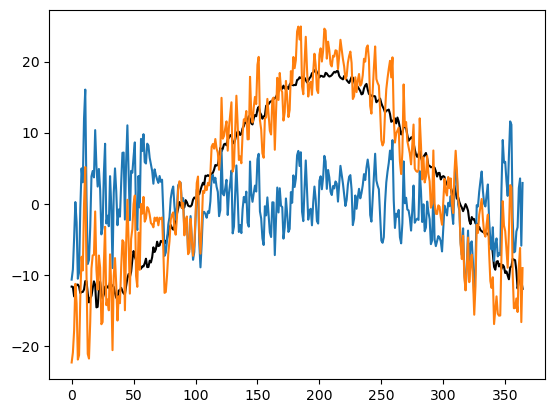

In [126]:
#compare seasonal cycle with anomaly
kk_basin = 0
plt.plot(T_mean_cycle[kk_basin,-365:], 'k')
plt.plot(T_np_anomaly[kk_basin,-365:])
plt.plot(T_np[kk_basin,-365:])

In [128]:
#calculate 90th percentile using 15-day window

window = 7 #days before and after day of interest 
T_90_raw_np = np.zeros((N_basins,366)) #initialize
T_90_np = np.zeros((N_basins,366)) #initialize

for day in tqdm(range(365)): #for each day of the year

    #select 15-day window centered on the current day of the year
    if day<7: #if early in the year, loop back to include december
        day_range = np.concatenate([np.arange(365 + day - window,365), np.arange(0, day + window+1)])
    elif day + 7 >= 365: #if late in the year, loop ahead to include january
        day_range = np.concatenate([np.arange(day - window, 365), np.arange(0, window - (364 - day))])
    else:
        day_range = np.arange(day - window, day + 8)

    inds = np.concatenate([np.where(t_doy == doy)[0] for doy in day_range], axis = -1) #all indices in full time series with one of these 15 days
    T_90_raw_np[:,day] = np.nanpercentile(T_np[:,inds], q = 90, axis = 1) #mean temp
    T_90_np[:,day] = np.nanpercentile(T_np_anomaly[:,inds], q = 90, axis = 1) #mean temp anomaly

T_90_np[:,-1] = T_90_np[:,-2] #day 366 equal to day 365

100%|█████████████████████████████████████████| 365/365 [35:40<00:00,  5.86s/it]


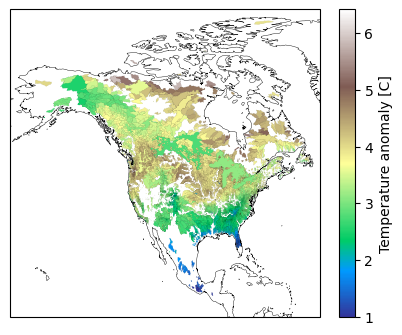

In [129]:
#visualize a single day of 90-th percentile temperature

kk_day = 200

ncols = 1
nrows = 1

fig, ax = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (5*ncols,4*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

var = T_90_np[:,kk_day]
cmap = 'terrain'
vmin = np.nanmin(var)
vmax = np.nanmax(var)

coll = PolyCollection(verts, 
                      edgecolors='k', 
                      linewidth = 0.02, 
                      transform = ccrs.PlateCarree()
                     )
coll.set_array(var[order])
coll.set_clim((vmin, vmax))
coll.set_cmap(cmap)
c = ax.add_collection(copy(coll))

ax.coastlines(resolution = '50m', linewidth = 0.3)
ax.axes.set_aspect('auto')

ax.set_xlim(left = -170, right = -50)
ax.set_ylim(bottom = 10, top = 85)


cbar = plt.colorbar(c, ax = ax)
cbar.ax.set_ylabel('Temperature anomaly [C]')

plt.show()

# Determine heatwave occurence

In [130]:
#determine when and where heatwaves are occuring

T_90_raw_repeating = T_90_raw_np[:,t_doy] #90th percentile of temperature -- make same size as temp data
T_90_repeating = T_90_np[:,t_doy] #90th percentile of temperature w/ mean cycle removed -- make same size as temp data
# is_above_90p = T_np > T_90_repeating #mean temp -- days >90th percentile
is_above_90p = T_np_anomaly > T_90_repeating #mean temp anomaly -- days >90th percentile

#initialize
is_heatwave = np.zeros((N_basins, N_days)) #heatwaves require three consecutive days >90th percentile
hw_day_start = np.zeros((N_basins, N_days))
hw_day_final = np.zeros((N_basins, N_days))

for day in tqdm(range(2,N_days)): #for each day
    
    count0 = np.sum(is_above_90p[:,day-2:day+1], axis = 1) == 3 #if current day and prior two days were >90p
    count1 = np.sum(is_above_90p[:,day-1:day+2], axis = 1) == 3 #if previous day, current day, and tomorrow are >90p
    count2 = np.sum(is_above_90p[:,day-0:day+3], axis = 1) == 3 #if current day and next two days are >90p
    is_heatwave[:,day] = (count0 | count1 | count2) #any one of those three conditions indicates a heatwave on this day

    hw_status_change = is_heatwave[:,day] - is_heatwave[:,day-1] #1 = heatwave starts; -1 indicates heatwave ends on next day   
    hw_day_start[hw_status_change==1,day] = 1
    hw_day_final[hw_status_change==-1,day-1] = 1

#total number of heatwave days
total_hw_days = np.sum(is_heatwave, axis = 1) 
total_hw_days[total_hw_days == 0] = np.nan

#heatwave count by season
total_hw_days_DJF = np.sum(is_heatwave[:,inds_DJF], axis = 1)
total_hw_days_MAM = np.sum(is_heatwave[:,inds_MAM], axis = 1)
total_hw_days_JJA = np.sum(is_heatwave[:,inds_JJA], axis = 1)
total_hw_days_SON = np.sum(is_heatwave[:,inds_SON], axis = 1)

#non-heatwave count by season
total_nonhw_days_DJF = np.sum(((is_heatwave[:,inds_DJF]) == 0) & ((np.isnan(T_np[0,inds_DJF])) == 0), axis = 1)
total_nonhw_days_MAM = np.sum(((is_heatwave[:,inds_MAM]) == 0) & ((np.isnan(T_np[0,inds_MAM])) == 0), axis = 1)
total_nonhw_days_JJA = np.sum(((is_heatwave[:,inds_JJA]) == 0) & ((np.isnan(T_np[0,inds_JJA])) == 0), axis = 1)
total_nonhw_days_SON = np.sum(((is_heatwave[:,inds_SON]) == 0) & ((np.isnan(T_np[0,inds_SON])) == 0), axis = 1)

# #mean daily precip by season
# P_mean_DJF = np.mean(P_np[:,inds_DJF], axis = 1)
# P_mean_MAM = np.mean(P_np[:,inds_MAM], axis = 1)
# P_mean_JJA = np.mean(P_np[:,inds_JJA], axis = 1)
# P_mean_SON = np.mean(P_np[:,inds_SON], axis = 1)

#calculate the average magnitude of heatwaves (temperature exceedance of 90th percentile)
# T_exceedance = T_np - T_90_repeating 
T_exceedance = T_np_anomaly - T_90_repeating 
T_hw_exceedance = np.nan*np.zeros((N_basins,N_days))
T_hw_exceedance[is_heatwave==1] = T_exceedance[is_heatwave==1]
T_hw_exceedance_mean = np.nanmean(T_hw_exceedance, axis = 1)

#exceedance by season
T_hw_exceedance_DJF = np.nanmean(T_hw_exceedance[:,inds_DJF], axis = 1)
T_hw_exceedance_MAM = np.nanmean(T_hw_exceedance[:,inds_MAM], axis = 1)
T_hw_exceedance_JJA = np.nanmean(T_hw_exceedance[:,inds_JJA], axis = 1)
T_hw_exceedance_SON = np.nanmean(T_hw_exceedance[:,inds_SON], axis = 1)


100%|████████████████████████████████████| 25200/25200 [01:04<00:00, 391.45it/s]


In [489]:
#for visualizing different styles of precipitation at different basins, determine wet/dry heatwaves for a couple basins

kk0 = 0 #quebec -- kk_hw = 0 --> example: wet during winter heatwave 
kk1 = 11181 #PNW -- kk_hw = 76 --> example: dry before, during, and after summer heatwave
kk2 = 5000 #southeast -- kk_hw = 31 --> example: dry during, wet after
kk3 = 11181 #PNW -- kk_hw = 155 --> example: dry before, wet during

kk_basins = np.array([kk0,kk1,kk2,kk1])
kk_basin = kk_basins[3]

wet_before = np.zeros(159, dtype = 'int')
wet_during = np.zeros(159, dtype = 'int')
wet_after = np.zeros(159, dtype = 'int')
dry = np.zeros(159, dtype = 'int')

for kk_hw in range(159):
    ind_hw_start = np.argwhere(hw_day_start[kk_basin,:] == 1).squeeze()[kk_hw]
    ind_hw_final = np.argwhere(hw_day_final[kk_basin,:] == 1).squeeze()[kk_hw]

    Pmean_before = np.mean(P_np[kk_basin,ind_hw_start-3 : ind_hw_start])
    Pmean_during = np.mean(P_np[kk_basin,ind_hw_start:ind_hw_final+1])
    Pmean_after = np.mean(P_np[kk_basin,ind_hw_final+1 : ind_hw_final + 5])

    if (Pmean_before > 3):
        wet_before[kk_hw] = 1
    elif Pmean_during > 5:
        wet_during[kk_hw] = 1
    elif (Pmean_after > 2*Pmean_during) & (Pmean_after > 5):
        wet_after[kk_hw] = 1
    elif (Pmean_before < 1) * (Pmean_during < 1) * (Pmean_after < 1):
        dry[kk_hw] = 1

print('Wet before')
print(np.argwhere(wet_before).squeeze())

print('\nWet during')
print(np.argwhere(wet_during).squeeze())

print('\nWet after')
print(np.argwhere(wet_after).squeeze())

print('\nDry')
print(np.argwhere(dry).squeeze())

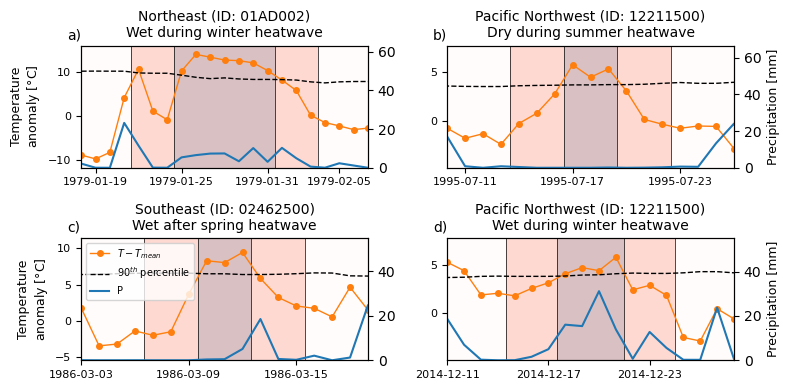

In [574]:
#visualize individual heatwaves and precipitation

saveIt = 0

kk0 = 0 #quebec -- kk_hw = 0 --> example: wet during winter heatwave 
kk1 = 11181 #PNW -- kk_hw = 76 --> example: dry before, during, and after summer heatwave
kk2 = 5000 #southeast -- kk_hw = 31 --> example: dry during, wet after
kk3 = 11181 #PNW -- kk_hw = 155 --> example: dry before, wet during

kk_basins = np.array([kk0,kk1,kk2,kk3])
kk_hws = np.array([0,76,31,155]) #these indices determined from cell above

titles = [
    'Northeast (ID: ' + IDs[kk_basins[0]] + ')\nWet during winter heatwave',
    'Pacific Northwest (ID: ' + IDs[kk_basins[1]] + ')\nDry during summer heatwave',
    'Southeast (ID: ' + IDs[kk_basins[2]] + ')\nWet after spring heatwave',
    'Pacific Northwest (ID: ' + IDs[kk_basins[3]] + ')\nWet during winter heatwave'
]

time = t.values

nrows = 2
ncols = 2

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 2*nrows))

for kk_ax, kk_basin in enumerate(kk_basins):

    ax = axes.flatten()[kk_ax]
    
    kk_hw = kk_hws[kk_ax]
    ind_hw_start = np.argwhere(hw_day_start[kk_basin,:] == 1).squeeze()[kk_hw]
    ind_hw_final = np.argwhere(hw_day_final[kk_basin,:] == 1).squeeze()[kk_hw]
    ind_start = ind_hw_start - 7
    ind_final = ind_hw_final + 7
    
    x0 = ind_start
    x1 = ind_hw_start - 3
    x2 = ind_hw_start
    x3 = ind_hw_final
    x4 = ind_hw_final + 3
    x5 = ind_final
    
    temps = np.concatenate([T_np[kk_basin, ind_start:ind_final+1],T_90_raw_repeating[kk_basin, ind_start:ind_final+1]])
    temps = np.concatenate([T_np_anomaly[kk_basin, ind_start:ind_final+1],T_90_repeating[kk_basin, ind_start:ind_final+1]])
    
    y0 = np.min(temps) - 2
    y1 = np.max(temps) + 2
    
    ##### HW TIMING SHADING
    
    hw_timing = np.zeros((N_days))
    hw_timing[x1:x2] = 1
    hw_timing[x2:x3+1] = 2
    hw_timing[x3+1:x4+1] = 1
    hw_timing = np.expand_dims(hw_timing, axis = 0)
    extent = [time[x0]-np.timedelta64(12,'h'),time[x5+1]-np.timedelta64(12,'h'),y0,y1] #offset by half a day for visualization; want heatwave period data included and not on edge of shading

    #shading
    ax.imshow(hw_timing[:,x0:x5+1], extent = extent, aspect = 'auto', cmap = 'Reds', alpha = 0.25)

    #vertical lines
    ax.plot([time[x1]-np.timedelta64(12,'h'),time[x1]-np.timedelta64(12,'h')],[y0, y1], 'k', linewidth = 0.5)
    ax.plot([time[x2]-np.timedelta64(12,'h'),time[x2]-np.timedelta64(12,'h')],[y0, y1], 'k', linewidth = 0.5)
    
    ax.plot([time[x3]+np.timedelta64(12,'h'),time[x3]+np.timedelta64(12,'h')],[y0, y1], 'k', linewidth = 0.5)
    ax.plot([time[x4]+np.timedelta64(12,'h'),time[x4]+np.timedelta64(12,'h')],[y0, y1], 'k', linewidth = 0.5)
    
    ##### WEATHER DATA
    
    ax.plot(time,T_np_anomaly[kk_basin, :], color = 'C1', marker = 'o', linewidth = 1, markersize = 4, label = '$T-T_{mean}$')
    ax.plot(time,T_90_repeating[kk_basin, :], color = 'k', linestyle = '--', label = '$90^{th}$ percentile', linewidth = 1)
    
    ax2 = ax.twinx()
    ax2.plot(time,P_np[kk_basin, :], color = 'C0', label = 'P')
    ax.plot(time,P_np[kk_basin, :]+100, color = 'C0', label = 'P')

    ##### FORMATTING
    
    for axis in [ax,ax2]:
        axis.set_xlim(left = time[x0], right = time[x5])
    ax.set_ylim(bottom = y0, top = y1)
    ax2.set_ylim(top = np.max(P_np[kk0, x0:x5]+40), bottom = 0)

    ax.set_xticks(ax.get_xticks()[::3])
    ax.tick_params(labelsize = 8)

    ax.set_title(titles[kk_ax], fontsize = 10)

    ax.text(x = -0.05, y = 1.05, s = abc[kk_ax], transform = ax.transAxes, fontsize = 10)

    if np.mod(kk_ax, 2) == 0:
        ax.set_ylabel('Temperature\nanomaly [$\degree$C]', fontsize = 9)
    else:
        ax2.set_ylabel('Precipitation [mm]', fontsize = 9)

    if kk_ax == 2:
        ax.legend(fontsize = 7, loc = 'upper left')

plt.tight_layout()

if saveIt:
    plt.savefig('Figures_hysets/examples.png', dpi = 300, bbox_inches = 'tight')



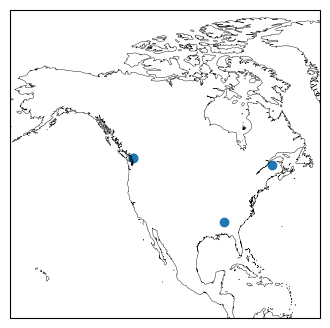

In [577]:
#visualize basin locations used as examples above

ncols = 1
nrows = 1

fig, ax = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (4*ncols,4*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

ax.scatter(lon[kk_basins],lat[kk_basins])

ax.coastlines(resolution = '50m', linewidth = 0.3)
ax.axes.set_aspect('auto')

ax.set_xlim(left = -170, right = -50)
ax.set_ylim(bottom = 10, top = 85)

plt.show()

In [ ]:
#delete for memory
del is_above_90p, T_90_repeating, T_exceedance, T_hw_exceedance

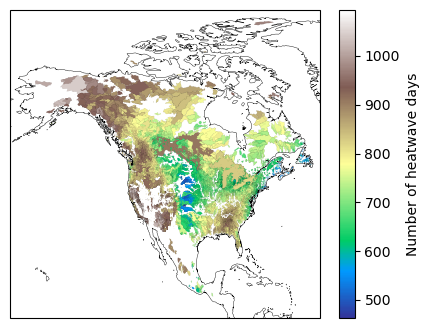

In [580]:
#visualize total heatwave days through space

ncols = 1
nrows = 1

fig, ax = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (5*ncols,4*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

var = total_hw_days
cmap = 'terrain'
vmin = np.nanmin(var)
vmax = np.nanmax(var)
# vmax = 1500

coll = PolyCollection(verts, 
                      edgecolors='k', 
                      linewidth = 0.02, 
                      transform = ccrs.PlateCarree()
                     )
coll.set_array(var[order])
coll.set_clim((vmin, vmax))
coll.set_cmap(cmap)
c = ax.add_collection(copy(coll))

ax.coastlines(resolution = '50m', linewidth = 0.3)
ax.axes.set_aspect('auto')

ax.set_xlim(left = -170, right = -50)
ax.set_ylim(bottom = 10, top = 85)

cbar = plt.colorbar(c, ax = ax)
cbar.ax.set_ylabel('Number of heatwave days')

plt.show()

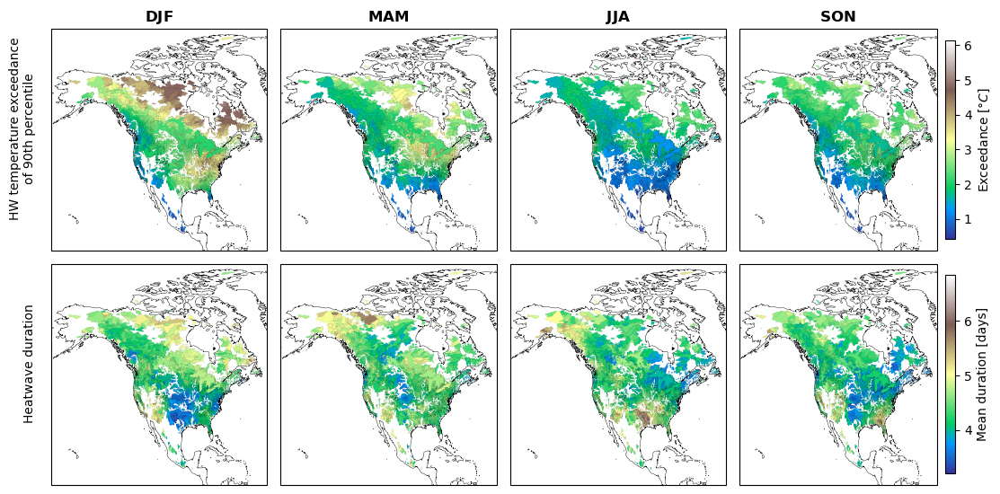

In [118]:
#HW TEMP EXCEEDANCE BY SEASON

saveIt = 0

nrows = 2
ncols = 4


fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (2.8*ncols,2.8*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables0 = [
    T_hw_exceedance_DJF, 
    T_hw_exceedance_MAM, 
    T_hw_exceedance_JJA, 
    T_hw_exceedance_SON
]

variables1 = [
    total_hw_days_DJF / N_hw_final_DJF, 
    total_hw_days_MAM / N_hw_final_MAM, 
    total_hw_days_JJA / N_hw_final_JJA, 
    total_hw_days_SON / N_hw_final_SON
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_season in range(4):

    ##### TOP ROW: TEMPERATURE EXCEEDENCE OF 90TH PERCENTILE
    
    ax = axes[0,kk_season]
    
    var = variables0[kk_season]
    
    vmax = np.nanmax([np.nanmax(v) for v in variables0])
    vmin = np.nanmin([np.nanmin(v) for v in variables0])
    
    cmap = 'terrain'
    # cmap = 'viridis'
    # cmap = 'RdBu_r'

    coll = PolyCollection(verts, 
                      edgecolors='k', 
                      linewidth = 0.02, 
                      transform = ccrs.PlateCarree()
                     )
    coll.set_array(var[order])
    coll.set_clim((vmin, vmax))
    coll.set_cmap(cmap)
    c = ax.add_collection(copy(coll))
    
    ax.coastlines(resolution = '50m', linewidth = 0.3)
    ax.axes.set_aspect('auto')
    
    ax.set_xlim(left = -170, right = -50)
    ax.set_ylim(bottom = 10, top = 85)

    ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
    if kk_season == 3:
        cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04)
        ylabel = 'Mean exceedance [$\degree C$]'
        cb.ax.set_ylabel(ylabel)

    if kk_season == 0:
        ylabel = 'HW temperature exceedance\nof 90th percentile'
        ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

    ##### BOTTOM ROW: MEAN HW DURATION
    
    ax = axes[1,kk_season]
    
    var = variables1[kk_season]
    
    vmax = np.nanmax([np.nanmax(v) for v in variables1])
    vmin = np.nanmin([np.nanmin(v) for v in variables1])
    
    cmap = 'terrain'
    # cmap = 'Reds'
    # cmap = 'RdBu_r'

    coll = PolyCollection(verts, 
                      edgecolors='k', 
                      linewidth = 0.02, 
                      transform = ccrs.PlateCarree()
                     )
    coll.set_array(var[order])
    coll.set_clim((vmin, vmax))
    coll.set_cmap(cmap)
    c = ax.add_collection(copy(coll))
    
    ax.coastlines(resolution = '50m', linewidth = 0.3)
    ax.axes.set_aspect('auto')
    
    ax.set_xlim(left = -170, right = -50)
    ax.set_ylim(bottom = 10, top = 85)

    if kk_season == 0:
        ylabel = 'Heatwave duration'
        ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

    if kk_season == 3:
        cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04)
        ylabel = 'Mean duration [days]'
        cb.ax.set_ylabel(ylabel)


plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/hw_stats_maps.png', dpi = 300, bbox_inches = 'tight')

plt.show()

# Precip: HW vs non-HW

In [16]:
#count heatwave and non-heatwave days that have non-negligible precipitation

P_threshold = 0.1
P_threshold = 1
# P_threshold = 5

#heatwave + wet days

total_hw_wet_days_DJF = np.sum(
    ((is_heatwave[:,inds_DJF]) == 1) &            #heatwave days in winter
    (P_np[0,inds_DJF] > P_threshold), axis = 1)   #with non-negligible precipitation

total_hw_wet_days_MAM = np.sum(       
    ((is_heatwave[:,inds_MAM]) == 1) &            #heatwave days in spring 
    (P_np[0,inds_MAM] > P_threshold), axis = 1)

total_hw_wet_days_JJA = np.sum(       
    ((is_heatwave[:,inds_JJA]) == 1) &            #heatwave days in summer
    (P_np[0,inds_JJA] > P_threshold), axis = 1)

total_hw_wet_days_SON = np.sum(       
    ((is_heatwave[:,inds_SON]) == 1) &            #heatwave days in autumn 
    (P_np[0,inds_SON] > P_threshold), axis = 1)

#nonheatwave + wet days

total_nonhw_wet_days_DJF = np.sum(
    ((1-is_heatwave[:,inds_DJF]) == 1) &           #non-heatwave days in winter
    ((1-np.isnan(T_np[0,inds_DJF])) == 1) &        #when not nan (e.g. not in 1950 - 1978)
    (P_np[0,inds_DJF] > P_threshold), axis = 1)    #with non-negligible precipitation

total_nonhw_wet_days_MAM = np.sum(
    ((1-is_heatwave[:,inds_MAM]) == 1) &           #non-heatwave days in spring
    ((1-np.isnan(T_np[0,inds_MAM])) == 1) & 
    (P_np[0,inds_MAM] > P_threshold), axis = 1)

total_nonhw_wet_days_JJA = np.sum(
    ((1-is_heatwave[:,inds_JJA]) == 1) &           #non-heatwave days in summer
    ((1-np.isnan(T_np[0,inds_JJA])) == 1) & 
    (P_np[0,inds_JJA] > P_threshold), axis = 1)

total_nonhw_wet_days_SON = np.sum(
    ((1-is_heatwave[:,inds_SON]) == 1) &           #non-heatwave days in autumn
    ((1-np.isnan(T_np[0,inds_SON])) == 1) & 
    (P_np[0,inds_SON] > P_threshold), axis = 1)

In [17]:
# HEATWAVE DAYS

P_binary = np.zeros((N_basins, N_days)) #will be 0 where precip is negligible; 1 where precip is non-negligible and heatwave occuring
P_binary[(P_np>P_threshold) & (is_heatwave==1)] = 1 #1 where precip is non-negligible and heatwave occuring

wet_hw_frac = np.sum(P_binary, axis = 1) / total_hw_days #fraction of heatwave days that are wet
wet_hw_frac_DJF = np.sum(P_binary[:,inds_DJF], axis = 1) / total_hw_days_DJF #fraction of heatwave days that are wet in winter
wet_hw_frac_MAM = np.sum(P_binary[:,inds_MAM], axis = 1) / total_hw_days_MAM #fraction of heatwave days that are wet in spring
wet_hw_frac_JJA = np.sum(P_binary[:,inds_JJA], axis = 1) / total_hw_days_JJA #fraction of heatwave days that are wet in summer
wet_hw_frac_SON = np.sum(P_binary[:,inds_SON], axis = 1) / total_hw_days_SON #fraction of heatwave days that are wet in autumn

del P_binary

# NON HEATWAVES DAYS

P_binary = np.zeros((N_basins, N_days)) #will be 0 where precip is negligible; 1 where precip is non-negligible and heatwave NOT occuring
P_binary[(P_np>P_threshold) & (is_heatwave==0)] = 1 #1 where precip is non-negligible and heatwave NOT occuring

wet_nonhw_frac = np.sum(P_binary, axis = 1) / (N_days - total_hw_days) #fraction of non-heatwave days that are wet
wet_nonhw_frac_DJF = np.sum(P_binary[:,inds_DJF], axis = 1) / (total_nonhw_days_DJF) #fraction of non-heatwave days that are wet in winter
wet_nonhw_frac_MAM = np.sum(P_binary[:,inds_MAM], axis = 1) / (total_nonhw_days_MAM) #fraction of non-heatwave days that are wet in spring
wet_nonhw_frac_JJA = np.sum(P_binary[:,inds_JJA], axis = 1) / (total_nonhw_days_JJA) #fraction of non-heatwave days that are wet in summer
wet_nonhw_frac_SON = np.sum(P_binary[:,inds_SON], axis = 1) / (total_nonhw_days_SON) #fraction of non-heatwave days that are wet in autumn

del P_binary

#calculate seasonal difference in wet fraction (+ve = wetter heatwave; -ve = drier heatwave)
wet_frac_diff = wet_hw_frac - wet_nonhw_frac 
wet_frac_diff_DJF = wet_hw_frac_DJF - wet_nonhw_frac_DJF
wet_frac_diff_MAM = wet_hw_frac_MAM - wet_nonhw_frac_MAM
wet_frac_diff_JJA = wet_hw_frac_JJA - wet_nonhw_frac_JJA
wet_frac_diff_SON = wet_hw_frac_SON - wet_nonhw_frac_SON

In [18]:
#now calculate mean precipitation on heatwave and non-heatwave days

P_hw = np.zeros((N_basins, N_days)) #initialize
P_nonhw = np.zeros((N_basins, N_days)) #initialize

P_hw[is_heatwave==1] = P_np[is_heatwave==1] #normal precip during heatwaves; 0 else
P_nonhw[is_heatwave==0] = P_np[is_heatwave==0] #normal precip during nonheatwaves; 0 else

# HEATWAVE DAYS
P_hw_mean = np.sum(P_hw, axis = 1) / total_hw_days #mean precip on heatwave days
P_hw_mean_DJF = np.sum(P_hw[:,inds_DJF], axis = 1) / total_hw_days_DJF #and by season
P_hw_mean_MAM = np.sum(P_hw[:,inds_MAM], axis = 1) / total_hw_days_MAM
P_hw_mean_JJA = np.sum(P_hw[:,inds_JJA], axis = 1) / total_hw_days_JJA
P_hw_mean_SON = np.sum(P_hw[:,inds_SON], axis = 1) / total_hw_days_SON

# NON HEATWAVE DAYS
# P_nonhw_mean = np.nansum(P_nonhw, axis = 1) / (total_nonhw_days) #mean precip on nonheatwave days
P_nonhw_mean_DJF = np.nansum(P_nonhw[:,inds_DJF], axis = 1) / (total_nonhw_days_DJF) #and by season
P_nonhw_mean_MAM = np.nansum(P_nonhw[:,inds_MAM], axis = 1) / (total_nonhw_days_MAM)
P_nonhw_mean_JJA = np.nansum(P_nonhw[:,inds_JJA], axis = 1) / (total_nonhw_days_JJA)
P_nonhw_mean_SON = np.nansum(P_nonhw[:,inds_SON], axis = 1) / (total_nonhw_days_SON)

# del P_hw, P_nonhw

#calculate seasonal difference in mean precip (+ve = wetter heatwave; -ve = drier heatwave)
P_mean_diff_DJF = P_hw_mean_DJF - P_nonhw_mean_DJF
P_mean_diff_MAM = P_hw_mean_MAM - P_nonhw_mean_MAM
P_mean_diff_JJA = P_hw_mean_JJA - P_nonhw_mean_JJA
P_mean_diff_SON = P_hw_mean_SON - P_nonhw_mean_SON

In [19]:
# calculate mean precipitation on *wet* heatwave days and *wet* non-heatwave days

P_hw = np.zeros((N_basins, N_days)) #initialize
P_nonhw = np.zeros((N_basins, N_days)) #initialize

P_hw[(is_heatwave==1) & (P_np > P_threshold)] = P_np[(is_heatwave==1) & (P_np > P_threshold)] #normal precip during heatwaves; 0 else
P_nonhw[(is_heatwave==0) & (P_np > P_threshold)] = P_np[(is_heatwave==0) & (P_np > P_threshold)] #normal precip during nonheatwaves; 0 else

# HEATWAVE DAYS
P_hw_mean_wet_DJF = np.sum(P_hw[:,inds_DJF], axis = 1) / total_hw_wet_days_DJF
P_hw_mean_wet_MAM = np.sum(P_hw[:,inds_MAM], axis = 1) / total_hw_wet_days_MAM
P_hw_mean_wet_JJA = np.sum(P_hw[:,inds_JJA], axis = 1) / total_hw_wet_days_JJA
P_hw_mean_wet_SON = np.sum(P_hw[:,inds_SON], axis = 1) / total_hw_wet_days_SON

# NON HEATWAVE DAYS
P_nonhw_mean_wet_DJF = np.nansum(P_nonhw[:,inds_DJF], axis = 1) / (total_nonhw_wet_days_DJF)
P_nonhw_mean_wet_MAM = np.nansum(P_nonhw[:,inds_MAM], axis = 1) / (total_nonhw_wet_days_MAM)
P_nonhw_mean_wet_JJA = np.nansum(P_nonhw[:,inds_JJA], axis = 1) / (total_nonhw_wet_days_JJA)
P_nonhw_mean_wet_SON = np.nansum(P_nonhw[:,inds_SON], axis = 1) / (total_nonhw_wet_days_SON)

# del P_hw, P_nonhw

P_mean_wet_diff_DJF = P_hw_mean_wet_DJF - P_nonhw_mean_wet_DJF
P_mean_wet_diff_MAM = P_hw_mean_wet_MAM - P_nonhw_mean_wet_MAM
P_mean_wet_diff_JJA = P_hw_mean_wet_JJA - P_nonhw_mean_wet_JJA
P_mean_wet_diff_SON = P_hw_mean_wet_SON - P_nonhw_mean_wet_SON

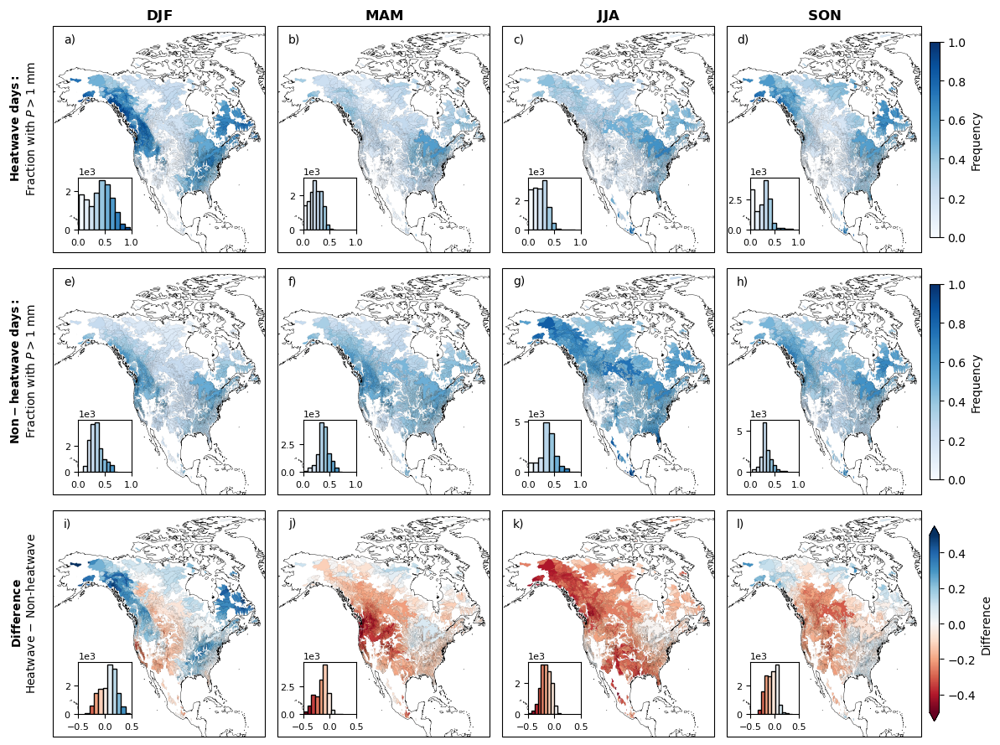

In [27]:
#FRACTION OF HEATWAVE AND NONHEATWAVE DAYS THAT ARE WET, AND DIFFERENCE

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [wet_hw_frac_DJF, wet_hw_frac_MAM, wet_hw_frac_JJA, wet_hw_frac_SON],
    [wet_nonhw_frac_DJF, wet_nonhw_frac_MAM, wet_nonhw_frac_JJA, wet_nonhw_frac_SON],
    [wet_frac_diff_DJF, wet_frac_diff_MAM, wet_frac_diff_JJA, wet_frac_diff_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 1 if kk_var < 2 else 0.5
        vmin = 0 if kk_var < 2 else -0.5
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Frequency' if kk_var < 2 else 'Difference'
            extend = None if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Heatwave}$' + ' ' + r'$\bf{days:}$' + '\nFraction with $P>{}$ mm'.format(P_threshold)
            elif kk_var == 1:
                ylabel = r'$\bf{Non-heatwave}$' + ' ' + r'$\bf{days:}$' + '\nFraction with $P>{}$ mm'.format(P_threshold)
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nHeatwave $-$ Non-heatwave'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

        ax.text(x = 0.05, y = 0.93, s = abc[kk_var*4 + kk_season], transform = ax.transAxes, fontsize = 10)

        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/wet_frac_pthresh{}.png'.format(P_threshold), dpi = 500, bbox_inches = 'tight')

plt.show()

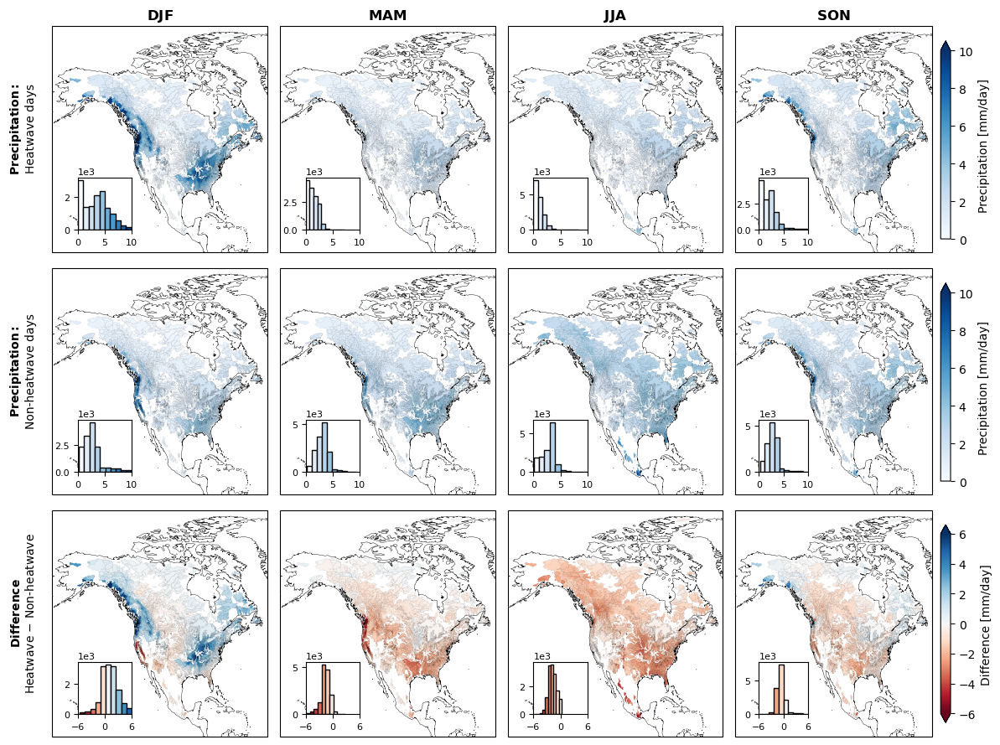

In [28]:
#MEAN PRECIP ON HEATWAVE AND NONHEATWAVE DAYS, AND DIFFERENCE

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_hw_mean_DJF, P_hw_mean_MAM, P_hw_mean_JJA, P_hw_mean_SON],
    [P_nonhw_mean_DJF, P_nonhw_mean_MAM, P_nonhw_mean_JJA, P_nonhw_mean_SON],
    [P_mean_diff_DJF, P_mean_diff_MAM, P_mean_diff_JJA, P_mean_diff_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 10 if kk_var < 2 else 6
        vmin = 0 if kk_var < 2 else -vmax
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation [mm/day]' if kk_var < 2 else 'Difference [mm/day]'
            extend = 'max' if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + '\nHeatwave days'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + '\nNon-heatwave days'
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nHeatwave $-$ Non-heatwave'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)
        
plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_mean_hw_nonhw.png', dpi = 500, bbox_inches = 'tight')

plt.show()

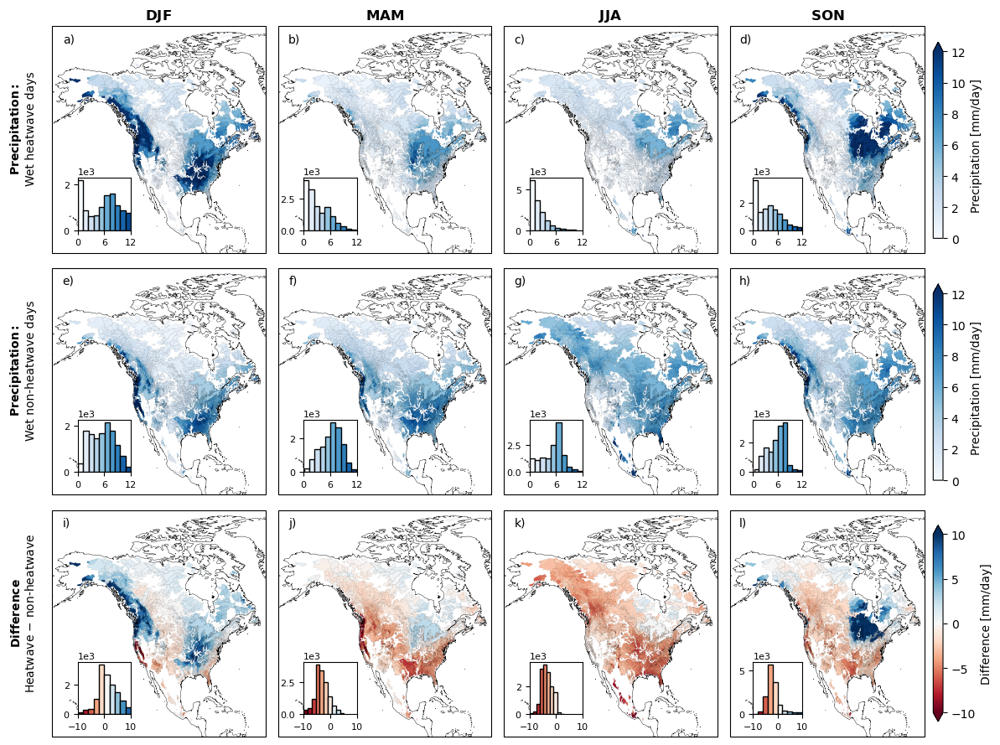

In [29]:
#MEAN PRECIP ON HEATWAVE AND NONHEATWAVE DAYS, AND DIFFERENCE
#ONLY CONSIDERING PRECIP ON DAYS w/ P > P_THRESHOLD

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_hw_mean_wet_DJF, P_hw_mean_wet_MAM, P_hw_mean_wet_JJA, P_hw_mean_wet_SON],
    [P_nonhw_mean_wet_DJF, P_nonhw_mean_wet_MAM, P_nonhw_mean_wet_JJA, P_nonhw_mean_wet_SON],
    [P_mean_wet_diff_DJF, P_mean_wet_diff_MAM, P_mean_wet_diff_JJA, P_mean_wet_diff_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 12 if kk_var < 2 else 10
        # vmax = 25 if kk_var < 2 else 20 #for P_threshold = 5mm case
        vmin = 0 if kk_var < 2 else -vmax
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation [mm/day]' if kk_var < 2 else 'Difference [mm/day]'
            extend = 'max' if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + '\nWet heatwave days'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + '\nWet non-heatwave days'
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nHeatwave $-$ non-heatwave'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

        ax.text(x = 0.05, y = 0.93, s = abc[kk_var*4 + kk_season], transform = ax.transAxes, fontsize = 10)

        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)
        
plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_mean_wet_hw_nonhw.png', dpi = 500, bbox_inches = 'tight')

plt.show()

In [30]:
#define colours for scatter plot quadrants

#4 quadrants
c_quadrants = np.array([
    [106, 166, 200],
    [61, 90, 128],
    [209, 202, 152],
    [238, 108, 77]
]) / 256

#darker shades
c_quadrants_2 = np.array([
    [66, 137, 179],
    [46, 68, 96],
    [168, 159, 77],
    [224, 61, 21]
]) / 256

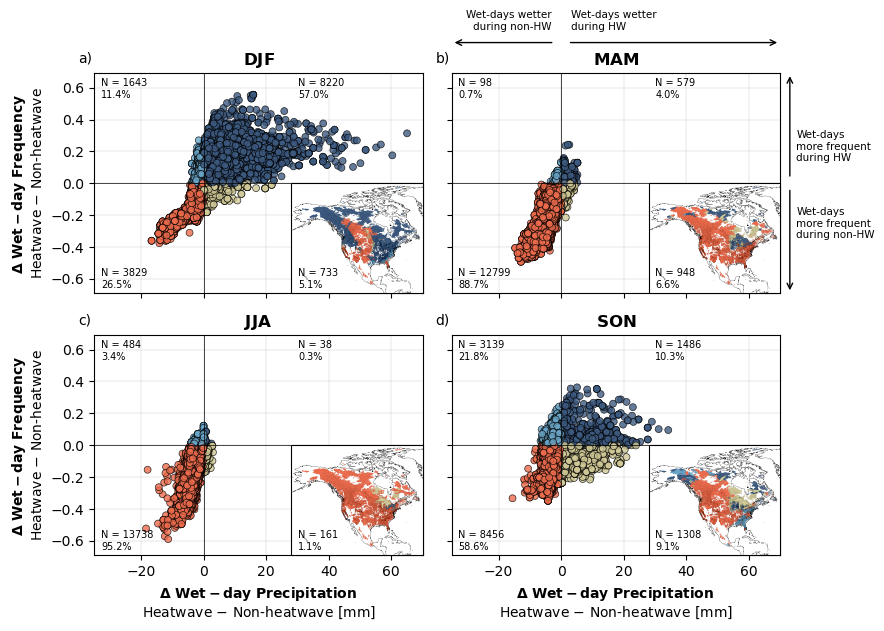

In [31]:
#FOR PAPER FIGURE

saveIt = 0

nrows = 2
ncols = 2

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 3.*nrows))

#x-axis
var1s = [P_mean_wet_diff_DJF,
         P_mean_wet_diff_MAM,
         P_mean_wet_diff_JJA,
         P_mean_wet_diff_SON]

#y-axis
var2s = [wet_frac_diff_DJF,
         wet_frac_diff_MAM,
         wet_frac_diff_JJA,
         wet_frac_diff_SON]

for kk, ax in enumerate(axes.flatten()): #for each subplot

    #label quadrant of each data point
    c_categories = np.zeros(N_basins, dtype = 'int')
    c_categories[(var1s[kk]>0) & (var2s[kk]>0)] = 1
    c_categories[(var1s[kk]>0) & (var2s[kk]<0)] = 2
    c_categories[(var1s[kk]<0) & (var2s[kk]<0)] = 3
    cs = c_quadrants[c_categories,:]
    
    s = ax.scatter(var1s[kk][order], var2s[kk][order], c = cs[order], edgecolor = 'k', linewidth = 0.5, alpha = 0.8, s = 25)

    ax.set_title(r'$\bf{' + seasons[kk] + '}$')

    if kk > 1:
        ax.set_xlabel(r'$\bf{\Delta}$ ' + r'$\bf{Wet-day}$ ' + r'$\bf{Precipitation}$ ' + '\nHeatwave $-$ Non-heatwave [mm]')
    else:
        ax.set_xticklabels([])
    if np.mod(kk,2) == 0:
        ax.set_ylabel(r'$\bf{\Delta}$ ' + r'$\bf{Wet-day}$ ' + r'$\bf{Frequency}$ ' + '\nHeatwave $-$ Non-heatwave')
    else:
        ax.set_yticklabels([])
    
    ax.axvline(x = 0, color = 'k', linewidth = 0.5)
    ax.axhline(y = 0, color = 'k', linewidth = 0.5)

    ax.set_xlim(left = -35, right = np.max(var1s)+5)
    ymax = np.max(np.abs(var2s)) + 0.1
    ymin = -ymax
    ax.set_ylim(bottom = ymin, top = ymax)

    ##### LABEL PERCENTAGE OF BASINS
    f1 = np.sum( (var1s[kk] < 0) & (var2s[kk] > 0) ) #/ N_basins
    f2 = np.sum( (var1s[kk] > 0) & (var2s[kk] > 0) ) #/ N_basins
    f3 = np.sum( (var1s[kk] > 0) & (var2s[kk] < 0) ) #/ N_basins
    f4 = np.sum( (var1s[kk] < 0) & (var2s[kk] < 0) ) #/ N_basins

    ax.grid(True, linewidth = 0.2)
    ax.set_axisbelow(True)
    ax.text(x = -0.05, y = 1.05, s = abc[kk], transform = ax.transAxes, fontsize = 10)

    
    ##### MAP INSET

    position = [0.6,0.0,0.4,0.5]
    ax_inset = plt.axes([0,0,1,1], aspect = 'auto', projection = ccrs.PlateCarree())
    ip = InsetPosition(ax, position)
    ax_inset.set_axes_locator(ip)

    coll = PolyCollection(verts, 
                          edgecolors='k', 
                          linewidth = 0.008, 
                          transform = ccrs.PlateCarree()
                         )
    coll.set_facecolor(cs[order])
    ax_inset.add_collection(copy(coll))
    
    ax_inset.coastlines(resolution = '50m', linewidth = 0.15)
    ax_inset.axes.set_aspect('auto')
    
    ax_inset.set_xlim(left = -170, right = -50)
    ax_inset.set_ylim(bottom = 10, top = 85)
    
    ax_inset.set_frame_on = False
    ax_inset.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

    #label percentage of basins in each quadrant
    ax.text(x = 0.02, y = 0.89, s = 'N = {}\n{}%'.format(np.round(f1,decimals = 2),np.round(f1/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax.text(x = 0.62, y = 0.89, s = 'N = {}\n{}%'.format(np.round(f2,decimals = 2),np.round(f2/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax_inset.text(x = 0.62, y = 0.025, s = 'N = {}\n{}%'.format(np.round(f3,decimals = 2),np.round(f3/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax.text(x = 0.02, y = 0.025, s = 'N = {}\n{}%'.format(np.round(f4,decimals = 2),np.round(f4/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)

plt.tight_layout()

#annotate y-axis
axes[0,1].text(x = 1.05, y = 0.6, s = 'Wet-days\nmore frequent\nduring HW', fontsize = 7.5, transform=axes[0,1].transAxes)
axes[0,1].text(x = 1.05, y = 0.25, s = 'Wet-days\nmore frequent\nduring non-HW', fontsize = 7.5, transform=axes[0,1].transAxes)

x1 = 1.03
axes[0,1].annotate(text = '', xy = (x1,0.52), xytext = (x1,1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')
axes[0,1].annotate(text = '', xy = (x1,0.48), xytext = (x1,0), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')

#annotate x-axis
y1 = 1.14
x0 = np.abs(axes[0,1].get_xlim()[0]) / (axes[0,1].get_xlim()[1] - axes[0,1].get_xlim()[0])

axes[0,1].text(x = x0+0.03, y = 1.2, s = 'Wet-days wetter\nduring HW', fontsize = 7.5, transform=axes[0,1].transAxes)
axes[0,1].text(x = x0-0.03, y = 1.2, s = 'Wet-days wetter\nduring non-HW', fontsize = 7.5, transform=axes[0,1].transAxes, ha = 'right')

axes[0,1].annotate(text = '', xy = (x0+0.02,y1), xytext = (1,y1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')
axes[0,1].annotate(text = '', xy = (x0-0.02,y1), xytext = (0,y1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')


if saveIt:
    plt.savefig('./Figures_hysets/hw_nonhw_scatter_map.png', dpi = 500, bbox_inches = 'tight')

plt.show()

In [32]:
# #FOR AGU FIGURE

# saveIt = 0

# nrows = 4
# ncols = 2

# fig = plt.figure(figsize = (6, 12))
# gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

# ax_scatter_DJF = fig.add_subplot(gs[0, :ncols-1])
# ax_scatter_MAM = fig.add_subplot(gs[1, :ncols-1])
# ax_scatter_JJA = fig.add_subplot(gs[2, :ncols-1])
# ax_scatter_SON = fig.add_subplot(gs[3, :ncols-1])

# ax_map_DJF = fig.add_subplot(gs[0, ncols-1], projection = ccrs.PlateCarree())
# ax_map_MAM = fig.add_subplot(gs[1, ncols-1], projection = ccrs.PlateCarree())
# ax_map_JJA = fig.add_subplot(gs[2, ncols-1], projection = ccrs.PlateCarree())
# ax_map_SON = fig.add_subplot(gs[3, ncols-1], projection = ccrs.PlateCarree())

# axes_scatter = [
#     ax_scatter_DJF, ax_scatter_MAM, ax_scatter_JJA, ax_scatter_SON
# ]

# axes_map = [
#     ax_map_DJF, ax_map_MAM, ax_map_JJA, ax_map_SON
# ]

# var1s = [P_mean_wet_diff_DJF,
#          P_mean_wet_diff_MAM,
#          P_mean_wet_diff_JJA,
#          P_mean_wet_diff_SON]

# var2s = [wet_frac_diff_DJF,
#          wet_frac_diff_MAM,
#          wet_frac_diff_JJA,
#          wet_frac_diff_SON]

# for kk, ax in enumerate(axes_scatter):

#     c_categories = np.zeros(N_basins, dtype = 'int')
#     c_categories[(var1s[kk]>0) & (var2s[kk]>0)] = 1
#     c_categories[(var1s[kk]>0) & (var2s[kk]<0)] = 2
#     c_categories[(var1s[kk]<0) & (var2s[kk]<0)] = 3

#     cs = c_quadrants[c_categories,:]
    
#     s = ax.scatter(var1s[kk][order], var2s[kk][order], c = cs[order], edgecolor = 'k', linewidth = 0.5, alpha = 0.8, s = 25)

#     ax.set_title(r'$\bf{' + seasons[kk] + '}$')

#     if kk == 3:
#         ax.set_xlabel(r'$\bf{\Delta}$ ' + r'$\bf{Wet-day}$ ' + r'$\bf{Precipitation}$ ' + '\nHeatwave $-$ Non-heatwave [mm]')
#     else:
#         ax.set_xticklabels([])
#     ax.set_ylabel(r'$\bf{\Delta}$ ' + r'$\bf{Wet-day}$ ' + r'$\bf{Frequency}$ ' + '\nHeatwave $-$ Non-heatwave')
    
#     ax.axvline(x = 0, color = 'k', linewidth = 0.5)
#     ax.axhline(y = 0, color = 'k', linewidth = 0.5)

#     ax.set_xlim(left = -35, right = np.max(var1s)+5)
#     ymax = np.max(np.abs(var2s)) + 0.1
#     ymin = -ymax
#     ax.set_ylim(bottom = ymin, top = ymax)

#     ##### LABEL PERCENTAGE OF BASINS
#     f1 = np.sum( (var1s[kk] < 0) & (var2s[kk] > 0) ) #/ N_basins
#     f2 = np.sum( (var1s[kk] > 0) & (var2s[kk] > 0) ) #/ N_basins
#     f3 = np.sum( (var1s[kk] > 0) & (var2s[kk] < 0) ) #/ N_basins
#     f4 = np.sum( (var1s[kk] < 0) & (var2s[kk] < 0) ) #/ N_basins

#     ax.text(x = 0.02, y = 0.92, s = 'N = {}'.format(np.round(f1,decimals = 2)), transform = ax.transAxes, fontsize = 9)
#     ax.text(x = 0.68, y = 0.92, s = 'N = {}'.format(np.round(f2,decimals = 2)), transform = ax.transAxes, fontsize = 9)
#     ax.text(x = 0.68, y = 0.03, s = 'N = {}'.format(np.round(f3,decimals = 2)), transform = ax.transAxes, fontsize = 9)
#     ax.text(x = 0.02, y = 0.03, s = 'N = {}'.format(np.round(f4,decimals = 2)), transform = ax.transAxes, fontsize = 9)

#     ax.grid(True, linewidth = 0.25)
#     ax.set_axisbelow(True)

#     ax = axes_map[kk]
    
#     ##### MAP INSET

#     coll = PolyCollection(verts, 
#                           edgecolors='k', 
#                           linewidth = 0.008, 
#                           transform = ccrs.PlateCarree()
#                          )
#     coll.set_facecolor(cs[order])
#     ax.add_collection(copy(coll))
    
#     ax.coastlines(resolution = '50m', linewidth = 0.15)
#     ax.axes.set_aspect('auto')
    
#     ax.set_xlim(left = -170, right = -50)
#     ax.set_ylim(bottom = 10, top = 85)
    
#     ax.set_frame_on = False
#     ax.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

# plt.tight_layout()

# if saveIt:
#     plt.savefig('./Figures_hysets/hw_nonhw_scatter_map_AGU.png', dpi = 500, bbox_inches = 'tight')

# plt.show()

In [33]:
# #FOR AGU FIGURE

# saveIt = 0

# nrows = 2
# ncols = 1

# fig = plt.figure(figsize = (6, 6))
# gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

# ax_scatter_DJF = fig.add_subplot(gs[0])#, :ncols-1])
# ax_scatter_JJA = fig.add_subplot(gs[1])#, :ncols-1])

# axes_scatter = [
#     ax_scatter_DJF,  ax_scatter_JJA
# ]

# axes_map = [
#     ax_map_DJF, ax_map_JJA
# ]

# var1s = [P_mean_wet_diff_DJF,
#          P_mean_wet_diff_JJA]

# var2s = [wet_frac_diff_DJF,
#          wet_frac_diff_JJA]

# for kk, ax in enumerate(axes_scatter):

#     c_categories = np.zeros(N_basins, dtype = 'int')
#     c_categories[(var1s[kk]>0) & (var2s[kk]>0)] = 1
#     c_categories[(var1s[kk]>0) & (var2s[kk]<0)] = 2
#     c_categories[(var1s[kk]<0) & (var2s[kk]<0)] = 3

#     cs = c_quadrants[c_categories,:]
    
#     s = ax.scatter(var1s[kk][order], var2s[kk][order], c = cs[order], edgecolor = 'k', linewidth = 0.5, alpha = 0.8, s = 25)

#     ax.set_title(r'$\bf{' + seasons[kk*2] + '}$')

#     if kk == 1:
#         ax.set_xlabel(r'$\bf{\Delta}$ ' + r'$\bf{Wet-day}$ ' + r'$\bf{Precipitation}$ ' + '\nHeatwave $-$ Non-heatwave [mm]')
#     else:
#         ax.set_xticklabels([])
#     ax.set_ylabel(r'$\bf{\Delta}$ ' + r'$\bf{Wet-day}$ ' + r'$\bf{Frequency}$ ' + '\nHeatwave $-$ Non-heatwave')
    
#     ax.axvline(x = 0, color = 'k', linewidth = 0.5)
#     ax.axhline(y = 0, color = 'k', linewidth = 0.5)

#     ax.set_xlim(left = -35, right = np.max(var1s)+5)
#     ymax = np.max(np.abs(var2s)) + 0.1
#     ymin = -ymax
#     ax.set_ylim(bottom = ymin, top = ymax)

#     ##### LABEL PERCENTAGE OF BASINS
#     f1 = np.sum( (var1s[kk] < 0) & (var2s[kk] > 0) ) #/ N_basins
#     f2 = np.sum( (var1s[kk] > 0) & (var2s[kk] > 0) ) #/ N_basins
#     f3 = np.sum( (var1s[kk] > 0) & (var2s[kk] < 0) ) #/ N_basins
#     f4 = np.sum( (var1s[kk] < 0) & (var2s[kk] < 0) ) #/ N_basins

#     ax.text(x = 0.02, y = 0.92, s = 'N = {}'.format(np.round(f1,decimals = 2)), transform = ax.transAxes, fontsize = 9)
#     ax.text(x = 0.52, y = 0.92, s = 'N = {}'.format(np.round(f2,decimals = 2)), transform = ax.transAxes, fontsize = 9)
#     ax.text(x = 0.52, y = 0.03, s = 'N = {}'.format(np.round(f3,decimals = 2)), transform = ax.transAxes, fontsize = 9)
#     ax.text(x = 0.02, y = 0.03, s = 'N = {}'.format(np.round(f4,decimals = 2)), transform = ax.transAxes, fontsize = 9)

#     ax.grid(True, linewidth = 0.25)
#     ax.set_axisbelow(True)
    
#     ##### MAP INSET

#     position = [0.7,0.0,0.3,0.5]
#     ax_inset = plt.axes([0,0,1,1], aspect = 'auto', projection = ccrs.PlateCarree())
#     ip = InsetPosition(ax, position)
#     ax_inset.set_axes_locator(ip)
#     ax = ax_inset

#     coll = PolyCollection(verts, 
#                           edgecolors='k', 
#                           linewidth = 0.008, 
#                           transform = ccrs.PlateCarree()
#                          )
#     coll.set_facecolor(cs[order])
#     ax.add_collection(copy(coll))
    
#     ax.coastlines(resolution = '50m', linewidth = 0.15)
#     ax.axes.set_aspect('auto')
    
#     ax.set_xlim(left = -170, right = -50)
#     ax.set_ylim(bottom = 10, top = 85)
    
#     ax.set_frame_on = False
#     ax.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

# plt.tight_layout()

# if saveIt:
#     plt.savefig('./Figures_hysets/hw_nonhw_scatter_map_AGU.png', dpi = 500, bbox_inches = 'tight')

# plt.show()

# Precip: Last HW-day vs others

In [34]:
##### NUMBER: final and nonfinal heatwave days

N_hw_final_DJF = np.sum(hw_day_final[:,inds_DJF], axis = 1) #number of final heatwave days
N_hw_final_MAM = np.sum(hw_day_final[:,inds_MAM], axis = 1)
N_hw_final_JJA = np.sum(hw_day_final[:,inds_JJA], axis = 1)
N_hw_final_SON = np.sum(hw_day_final[:,inds_SON], axis = 1)

a = (is_heatwave == 1) & (hw_day_final == 0) #1 where is a heatwave but a non-final day
N_hw_nonfinal_DJF = np.sum(a[:,inds_DJF], axis = 1)
N_hw_nonfinal_MAM = np.sum(a[:,inds_MAM], axis = 1)
N_hw_nonfinal_JJA = np.sum(a[:,inds_JJA], axis = 1)
N_hw_nonfinal_SON = np.sum(a[:,inds_SON], axis = 1)
del a

##### PRECIP: mean precip on final and nonfinal days of ALL heatwaves -- not just wet heatwaves

#final heatwave days
P_hw_final = P_hw * hw_day_final #normal precip on final hw days, zero else
P_hw_final_mean_DJF = np.sum(P_hw_final[:,inds_DJF], axis = 1) / N_hw_final_DJF
P_hw_final_mean_MAM = np.sum(P_hw_final[:,inds_MAM], axis = 1) / N_hw_final_MAM
P_hw_final_mean_JJA = np.sum(P_hw_final[:,inds_JJA], axis = 1) / N_hw_final_JJA
P_hw_final_mean_SON = np.sum(P_hw_final[:,inds_SON], axis = 1) / N_hw_final_SON

del P_hw_final

#nonfinal heatwave days
hw_day_nonfinal = np.zeros((N_basins,N_days)) #1 on heatwave days other than final heatwave day
hw_day_nonfinal[is_heatwave == 1] = 1
hw_day_nonfinal[hw_day_final == 1] = 0

P_hw_nonfinal = P_hw * hw_day_nonfinal
P_hw_nonfinal_mean_DJF = np.sum(P_hw_nonfinal[:,inds_DJF], axis = 1) / N_hw_nonfinal_DJF
P_hw_nonfinal_mean_MAM = np.sum(P_hw_nonfinal[:,inds_MAM], axis = 1) / N_hw_nonfinal_MAM
P_hw_nonfinal_mean_JJA = np.sum(P_hw_nonfinal[:,inds_JJA], axis = 1) / N_hw_nonfinal_JJA
P_hw_nonfinal_mean_SON = np.sum(P_hw_nonfinal[:,inds_SON], axis = 1) / N_hw_nonfinal_SON

del P_hw_nonfinal, P_hw

#difference
P_final_nonfinal_diff_DJF = P_hw_final_mean_DJF - P_hw_nonfinal_mean_DJF
P_final_nonfinal_diff_MAM = P_hw_final_mean_MAM - P_hw_nonfinal_mean_MAM
P_final_nonfinal_diff_JJA = P_hw_final_mean_JJA - P_hw_nonfinal_mean_JJA
P_final_nonfinal_diff_SON = P_hw_final_mean_SON - P_hw_nonfinal_mean_SON

In [35]:
#NOW, ONLY CONSIDER WET HEATWAVES

#initialize: number of heatwaves with mean daily precip > threshold (i.e. number of final days within wet heatwaves)
N_wet = np.zeros(N_basins)
N_wet_DJF = np.zeros(N_basins)
N_wet_MAM = np.zeros(N_basins)
N_wet_JJA = np.zeros(N_basins)
N_wet_SON = np.zeros(N_basins)

#initialize: number of nonfinals days within wet heatwaves 
N_nonfinal_wet = np.zeros(N_basins)
N_nonfinal_wet_DJF = np.zeros(N_basins)
N_nonfinal_wet_MAM = np.zeros(N_basins)
N_nonfinal_wet_JJA = np.zeros(N_basins)
N_nonfinal_wet_SON = np.zeros(N_basins)

#initialize: during wet heatwaves, number of wet final days
N_wet_final_wet_DJF = np.zeros(N_basins)
N_wet_final_wet_MAM = np.zeros(N_basins)
N_wet_final_wet_JJA = np.zeros(N_basins)
N_wet_final_wet_SON = np.zeros(N_basins)

#initialize: during wet heatwaves, number of wet nonfinal days
N_wet_nonfinal_wet_DJF = np.zeros(N_basins)
N_wet_nonfinal_wet_MAM = np.zeros(N_basins)
N_wet_nonfinal_wet_JJA = np.zeros(N_basins)
N_wet_nonfinal_wet_SON = np.zeros(N_basins)

#initialize: mean precip on final days of wet heatwaves
P_wet_final_day = np.zeros(N_basins)
P_wet_final_day_DJF = np.zeros(N_basins)
P_wet_final_day_MAM = np.zeros(N_basins)
P_wet_final_day_JJA = np.zeros(N_basins)
P_wet_final_day_SON = np.zeros(N_basins)

#initialize: mean precip on nonfinal days of wet heatwaves
P_wet_nonfinal_day = np.zeros(N_basins)
P_wet_nonfinal_day_DJF = np.zeros(N_basins)
P_wet_nonfinal_day_MAM = np.zeros(N_basins)
P_wet_nonfinal_day_JJA = np.zeros(N_basins)
P_wet_nonfinal_day_SON = np.zeros(N_basins)

for kk_basin in tqdm(range(N_basins)): #for each basin

    hw_day_start_inds = np.argwhere(hw_day_start[kk_basin,:] == 1).squeeze() #all start days of heatwaves at this basin
    hw_day_final_inds = np.argwhere(hw_day_final[kk_basin,:] == 1).squeeze() #all final days of heatwaves at this basin
    
    if len(hw_day_start_inds) == len(hw_day_final_inds): #make sure number of start days is the same as final days
        N_hws = len(hw_day_start_inds)
    else:
        N_hws = len(hw_day_start_inds) - 1 #in this case, a heatwave starts but does not finish before the end of the record; remove last heatwave

    duration = np.zeros(N_hws)
    
    for kk_hw in range(N_hws): #for each heatwave at this basin
    
        start_day = hw_day_start_inds[kk_hw]
        final_day = hw_day_final_inds[kk_hw]
        duration[kk_hw] = final_day - start_day + 1

        # if np.sum(P_np[kk_basin,start_day:final_day+1]) > 0.1*duration[kk_hw]: #if a "wet" event (i.e. more than trace daily precip)
        if np.sum(P_np[kk_basin,start_day:final_day+1]) > P_threshold*duration[kk_hw]: #if a "wet" event (i.e. more than threshold mean daily precip)

            P_wet_final_day[kk_basin] += P_np[kk_basin,final_day] #running total final day precip
            P_wet_nonfinal_day[kk_basin] += np.nansum(P_np[kk_basin,start_day:final_day]) #running total nonfinal day precip
            
            N_wet[kk_basin] += 1 #running count of total wet heatwaves (equal to final heatwave days during wet heatwaves)
            N_nonfinal_wet[kk_basin] += (duration[kk_hw] - 1) #running count of total nonfinal days during wet heatwaves

            #WINTER
            if (t_pd[start_day].month == 12) | (t_pd[start_day].month == 1) | (t_pd[start_day].month == 2): #if winter
                N_wet_DJF[kk_basin] += 1 #running seasonal count of wet heatwaves
                N_nonfinal_wet_DJF[kk_basin] += (duration[kk_hw] - 1) #running seasonal total nonfinal day precip 
                P_wet_final_day_DJF[kk_basin] += P_np[kk_basin,final_day] #add final day heatwave precip to running tally; to divide by number of days later
                P_wet_nonfinal_day_DJF[kk_basin] += np.nansum(P_np[kk_basin,start_day:final_day]) #add nonfinal days precip to running tally

                if P_np[kk_basin,final_day] > P_threshold: #if final day has more than threshold
                    N_wet_final_wet_DJF[kk_basin] += 1 #running count of wet final days during wet heatwaves

                for kk_day in range(start_day, final_day): #for each nonfinal day
                    if P_np[kk_basin,kk_day] > P_threshold: #if nonfinal day is wet
                        N_wet_nonfinal_wet_DJF[kk_basin] += 1 #running count of wet nonfinal days during wet heatwaves

            #SPRING
            elif (t_pd[start_day].month == 3) | (t_pd[start_day].month == 4) | (t_pd[start_day].month == 5): #if spring
                N_wet_MAM[kk_basin] += 1
                N_nonfinal_wet_MAM[kk_basin] += (duration[kk_hw] - 1) #all days except the final day
                P_wet_final_day_MAM[kk_basin] += P_np[kk_basin,final_day]
                P_wet_nonfinal_day_MAM[kk_basin] += np.nansum(P_np[kk_basin,start_day:final_day])

                if P_np[kk_basin,final_day] > P_threshold: #if final day has more than threshold
                    N_wet_final_wet_MAM[kk_basin] += 1

                for kk_day in range(start_day, final_day):
                    if P_np[kk_basin,kk_day] > P_threshold:
                        N_wet_nonfinal_wet_MAM[kk_basin] += 1

            #SUMMER
            elif (t_pd[start_day].month == 6) | (t_pd[start_day].month == 7) | (t_pd[start_day].month == 8): #if summer
                N_wet_JJA[kk_basin] += 1
                N_nonfinal_wet_JJA[kk_basin] += (duration[kk_hw] - 1) #all days except the final day
                P_wet_final_day_JJA[kk_basin] += P_np[kk_basin,final_day]
                P_wet_nonfinal_day_JJA[kk_basin] += np.nansum(P_np[kk_basin,start_day:final_day])
                
                if P_np[kk_basin,final_day] > P_threshold: #if final day has more than threshold
                    N_wet_final_wet_JJA[kk_basin] += 1

                for kk_day in range(start_day, final_day):
                    if P_np[kk_basin,kk_day] > P_threshold:
                        N_wet_nonfinal_wet_JJA[kk_basin] += 1

            #AUTUMN
            elif (t_pd[start_day].month == 9) | (t_pd[start_day].month == 10) | (t_pd[start_day].month == 11): #if fall
                N_wet_SON[kk_basin] += 1
                N_nonfinal_wet_SON[kk_basin] += (duration[kk_hw] - 1) #all days except the final day
                P_wet_final_day_SON[kk_basin] += P_np[kk_basin,final_day]
                P_wet_nonfinal_day_SON[kk_basin] += np.nansum(P_np[kk_basin,start_day:final_day])

                if P_np[kk_basin,final_day] > P_threshold: #if final day has more than threshold
                    N_wet_final_wet_SON[kk_basin] += 1

                for kk_day in range(start_day, final_day):
                    if P_np[kk_basin,kk_day] > P_threshold:
                        N_wet_nonfinal_wet_SON[kk_basin] += 1

    #mean precip of final days
    P_wet_final_day[kk_basin] /= N_wet[kk_basin]
    P_wet_final_day_DJF[kk_basin] /= N_wet_DJF[kk_basin]
    P_wet_final_day_MAM[kk_basin] /= N_wet_MAM[kk_basin]
    P_wet_final_day_JJA[kk_basin] /= N_wet_JJA[kk_basin]
    P_wet_final_day_SON[kk_basin] /= N_wet_SON[kk_basin]

    #mean precip of nonfinal days
    P_wet_nonfinal_day[kk_basin] /= N_nonfinal_wet[kk_basin]
    P_wet_nonfinal_day_DJF[kk_basin] /= N_nonfinal_wet_DJF[kk_basin]
    P_wet_nonfinal_day_MAM[kk_basin] /= N_nonfinal_wet_MAM[kk_basin]
    P_wet_nonfinal_day_JJA[kk_basin] /= N_nonfinal_wet_JJA[kk_basin]
    P_wet_nonfinal_day_SON[kk_basin] /= N_nonfinal_wet_SON[kk_basin]

#difference
P_final_nonfinal_diff_DJF = P_wet_final_day_DJF - P_wet_nonfinal_day_DJF
P_final_nonfinal_diff_MAM = P_wet_final_day_MAM - P_wet_nonfinal_day_MAM
P_final_nonfinal_diff_JJA = P_wet_final_day_JJA - P_wet_nonfinal_day_JJA
P_final_nonfinal_diff_SON = P_wet_final_day_SON - P_wet_nonfinal_day_SON

# del hw_day_start

#ONLY WET HEATWAVES: fraction of final days / other days that are wet

frac_wet_final_wet_DJF = N_wet_final_wet_DJF / N_wet_DJF #number of final days within wet heatwaves that are wet, divided by number of wet heatwaves
frac_wet_final_wet_MAM = N_wet_final_wet_MAM / N_wet_MAM
frac_wet_final_wet_JJA = N_wet_final_wet_JJA / N_wet_JJA
frac_wet_final_wet_SON = N_wet_final_wet_SON / N_wet_SON

frac_wet_nonfinal_wet_DJF = N_wet_nonfinal_wet_DJF / N_nonfinal_wet_DJF #number of nonfinal days within wet heatwaves that are wet, divided by number of nonfinal days within wet heatwaves
frac_wet_nonfinal_wet_MAM = N_wet_nonfinal_wet_MAM / N_nonfinal_wet_MAM
frac_wet_nonfinal_wet_JJA = N_wet_nonfinal_wet_JJA / N_nonfinal_wet_JJA
frac_wet_nonfinal_wet_SON = N_wet_nonfinal_wet_SON / N_nonfinal_wet_SON

frac_wet_diff_DJF = frac_wet_final_wet_DJF - frac_wet_nonfinal_wet_DJF
frac_wet_diff_MAM = frac_wet_final_wet_MAM - frac_wet_nonfinal_wet_MAM
frac_wet_diff_JJA = frac_wet_final_wet_JJA - frac_wet_nonfinal_wet_JJA
frac_wet_diff_SON = frac_wet_final_wet_SON - frac_wet_nonfinal_wet_SON

100%|████████████████████████████████████| 14425/14425 [01:48<00:00, 133.34it/s]


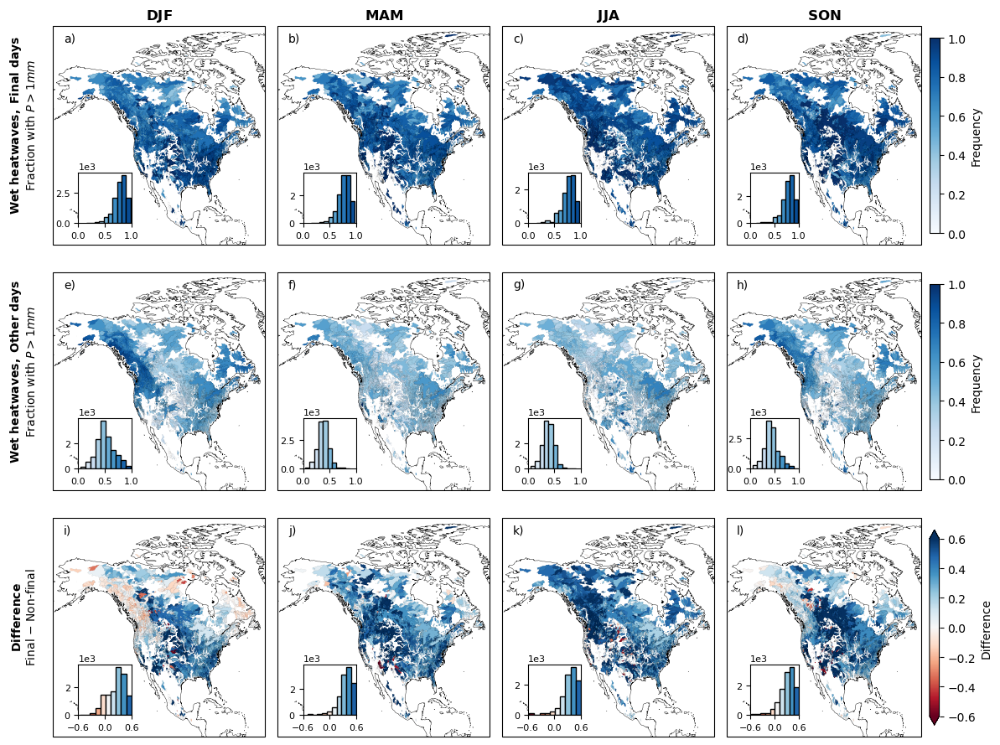

In [36]:
#FRAC WET FINAL AND NONFINAL HEATWAVE DAYS, AND DIFFERENCE
#ONLY CONSIDERING WET HEATWAVES WHERE P > P_threshold

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [frac_wet_final_wet_DJF, frac_wet_final_wet_MAM, frac_wet_final_wet_JJA, frac_wet_final_wet_SON],
    [frac_wet_nonfinal_wet_DJF, frac_wet_nonfinal_wet_MAM, frac_wet_nonfinal_wet_JJA, frac_wet_nonfinal_wet_SON],
    [frac_wet_diff_DJF, frac_wet_diff_MAM, frac_wet_diff_JJA, frac_wet_diff_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable

    if kk_var == 0:   
        vmax = 1
        vmin = 0
    elif kk_var == 1:
        vmax = 1
        vmin = 0
    elif kk_var == 2:        
        vmax = 0.6
        vmin = -0.6

    for kk_season in range(4): #for each season

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Frequency' if kk_var < 2 else 'Difference'
            extend = None if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)
        
        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Wet}$ ' + r'$\bf{heatwaves,}$ ' + r'$\bf{Final}$ ' + r'$\bf{days}$' + '\nFraction with $P>{}mm$'.format(P_threshold)
            elif kk_var == 1:
                ylabel = r'$\bf{Wet}$ ' + r'$\bf{heatwaves,}$ ' + r'$\bf{Other}$ ' + r'$\bf{days}$' + '\nFraction with $P>{}mm$'.format(P_threshold)
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nFinal $-$ Non-final'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

        ax.text(x = 0.05, y = 0.93, s = abc[kk_var*4 + kk_season], transform = ax.transAxes, fontsize = 10)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/frac_final_nonfinal_wet_hws.png', dpi = 300, bbox_inches = 'tight')

plt.show()

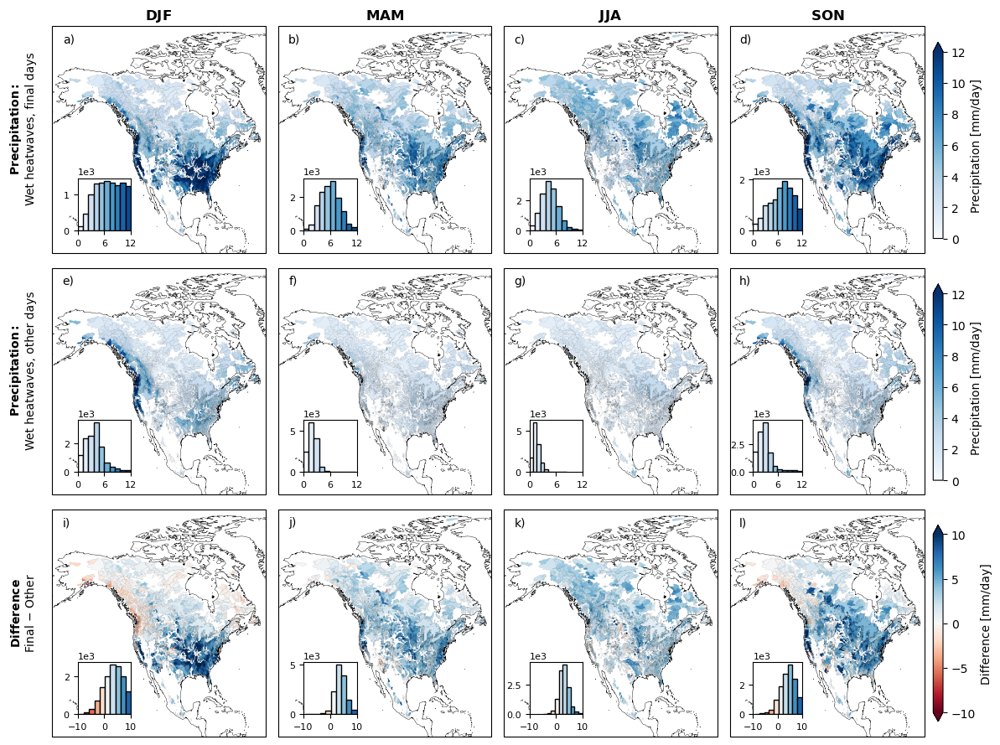

In [37]:
#MEAN PRECIP ON FINAL` AND NONFINAL HEATWAVE DAYS, AND DIFFERENCE
#ONLY CONSIDERING WET HEATWAVES WHERE P > P_threshold mm/day

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_wet_final_day_DJF, P_wet_final_day_MAM, P_wet_final_day_JJA, P_wet_final_day_SON],
    [P_wet_nonfinal_day_DJF, P_wet_nonfinal_day_MAM, P_wet_nonfinal_day_JJA, P_wet_nonfinal_day_SON],
    [P_final_nonfinal_diff_DJF, P_final_nonfinal_diff_MAM, P_final_nonfinal_diff_JJA, P_final_nonfinal_diff_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable

    if kk_var == 0:   
        vmin = 0
        vmax = 12  
    elif kk_var == 1:
        vmin = 0
        vmax = 12
    elif kk_var == 2:        
        vmax = 10
        vmin = -vmax

    for kk_season in range(4): #for each season

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation [mm/day]' if kk_var < 2 else 'Difference [mm/day]'
            extend = 'max' if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

            if kk_var == 2:
                cb.set_ticks(np.linspace(vmin,vmax,5))

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + '\nWet heatwaves, final days'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + '\nWet heatwaves, other days'
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nFinal $-$ Other'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

        ax.text(x = 0.05, y = 0.93, s = abc[kk_var*4 + kk_season], transform = ax.transAxes, fontsize = 10)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_mean_hw_final_nonfinal.png', dpi = 300, bbox_inches = 'tight')

plt.show()

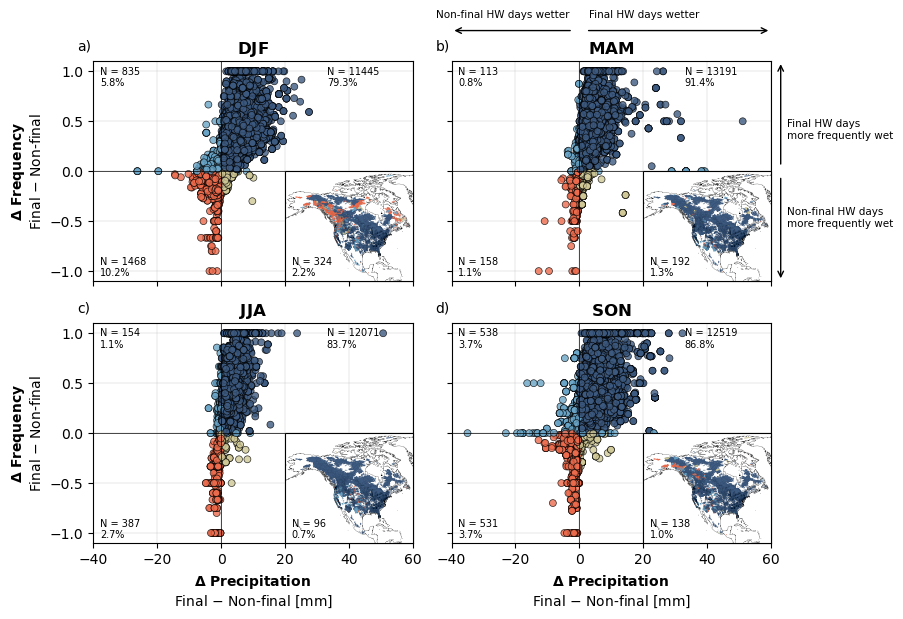

In [44]:
#FOR PAPER FIGURE

saveIt = 0

nrows = 2
ncols = 2

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 3.*nrows))

var1s = [P_final_nonfinal_diff_DJF, 
         P_final_nonfinal_diff_MAM, 
         P_final_nonfinal_diff_JJA, 
         P_final_nonfinal_diff_SON]

var2s = [frac_wet_diff_DJF, 
         frac_wet_diff_MAM, 
         frac_wet_diff_JJA, 
         frac_wet_diff_SON]

for kk, ax in enumerate(axes.flatten()):

    c_categories = np.zeros(N_basins, dtype = 'int')
    c_categories[(var1s[kk]>0) & (var2s[kk]>0)] = 1
    c_categories[(var1s[kk]>0) & (var2s[kk]<0)] = 2
    c_categories[(var1s[kk]<0) & (var2s[kk]<0)] = 3

    cs = c_quadrants[c_categories,:]
    
    s = ax.scatter(var1s[kk][order], var2s[kk][order], c = cs[order], edgecolor = 'k', linewidth = 0.5, alpha = 0.8, s = 25)

    ax.set_title(r'$\bf{' + seasons[kk] + '}$')

    if kk > 1:
        ax.set_xlabel(r'$\bf{\Delta}$ ' + r'$\bf{Precipitation}$ ' + '\nFinal $-$ Non-final [mm]')
    else:
        ax.set_xticklabels([])
    if np.mod(kk,2) == 0:
        ax.set_ylabel(r'$\bf{\Delta}$ ' + r'$\bf{Frequency}$ ' + '\nFinal $-$ Non-final')
    else:
        ax.set_yticklabels([])
    
    ax.axvline(x = 0, color = 'k', linewidth = 0.5)
    ax.axhline(y = 0, color = 'k', linewidth = 0.5)

    ax.set_xlim(left = -40, right = 60)
    ymax = np.nanmax(np.abs(var2s)) + 0.1
    ymin = -ymax
    ax.set_ylim(bottom = ymin, top = ymax)

    ##### LABEL PERCENTAGE OF BASINS
    f1 = np.sum( (var1s[kk] < 0) & (var2s[kk] > 0) ) #/ N_basins
    f2 = np.sum( (var1s[kk] > 0) & (var2s[kk] > 0) ) #/ N_basins
    f3 = np.sum( (var1s[kk] > 0) & (var2s[kk] < 0) ) #/ N_basins
    f4 = np.sum( (var1s[kk] < 0) & (var2s[kk] < 0) ) #/ N_basins

    ax.grid(True, linewidth = 0.2)
    ax.set_axisbelow(True)

    ax.text(x = -0.05, y = 1.05, s = abc[kk], transform = ax.transAxes, fontsize = 10)
    
    ##### MAP INSET

    position = [0.6,0.0,0.4,0.5]
    ax_inset = plt.axes([0,0,1,1], aspect = 'auto', projection = ccrs.PlateCarree())
    ip = InsetPosition(ax, position)
    ax_inset.set_axes_locator(ip)

    coll = PolyCollection(verts, 
                          edgecolors='k', 
                          linewidth = 0.008, 
                          transform = ccrs.PlateCarree()
                         )

    coll.set_facecolor(cs[order])
    ax_inset.add_collection(copy(coll))
    
    ax_inset.coastlines(resolution = '50m', linewidth = 0.15)
    ax_inset.axes.set_aspect('auto')
    
    ax_inset.set_xlim(left = -170, right = -50)
    ax_inset.set_ylim(bottom = 10, top = 85)
    
    ax_inset.set_frame_on = False
    ax_inset.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

    ax.text(x = 0.02, y = 0.89, s = 'N = {}\n{}%'.format(np.round(f1,decimals = 2),np.round(f1/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax.text(x = 0.73, y = 0.89, s = 'N = {}\n{}%'.format(np.round(f2,decimals = 2),np.round(f2/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax_inset.text(x = 0.62, y = 0.025, s = 'N = {}\n{}%'.format(np.round(f3,decimals = 2),np.round(f3/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax.text(x = 0.02, y = 0.025, s = 'N = {}\n{}%'.format(np.round(f4,decimals = 2),np.round(f4/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)

plt.tight_layout()

#annotate y-axis
axes[0,1].text(x = 1.05, y = 0.65, s = 'Final HW days\nmore frequently wet', fontsize = 7.5, transform=axes[0,1].transAxes)
axes[0,1].text(x = 1.05, y = 0.25, s = 'Non-final HW days\nmore frequently wet', fontsize = 7.5, transform=axes[0,1].transAxes)

x1 = 1.03
axes[0,1].annotate(text = '', xy = (x1,0.52), xytext = (x1,1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')
axes[0,1].annotate(text = '', xy = (x1,0.48), xytext = (x1,0), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')

#annotate x-axis
y1 = 1.14
x0 = np.abs(axes[0,1].get_xlim()[0]) / (axes[0,1].get_xlim()[1] - axes[0,1].get_xlim()[0])

axes[0,1].text(x = x0+0.03, y = 1.2, s = 'Final HW days wetter', fontsize = 7.5, transform=axes[0,1].transAxes)
axes[0,1].text(x = x0-0.03, y = 1.2, s = 'Non-final HW days wetter', fontsize = 7.5, transform=axes[0,1].transAxes, ha = 'right')

axes[0,1].annotate(text = '', xy = (x0+0.02,y1), xytext = (1,y1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')
axes[0,1].annotate(text = '', xy = (x0-0.02,y1), xytext = (0,y1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')


if saveIt:
    plt.savefig('./Figures_hysets/final_nonfinal_scatter_map.png', dpi = 500, bbox_inches = 'tight')

plt.show()

# Precip: Before / during / after HW

In [45]:
#determine days that are just before each heatwave

days_prior_heatwave = np.zeros_like(P_np) #initialize
N_days_before_after = 3
# N_days_before_after = 7

for kk_day in tqdm(range(N_days-N_days_before_after)): #for each day except for last three

    is_heatwave_plus_1day = np.zeros_like(is_heatwave[:,0]) #initialize
    is_heatwave_plus_2day = np.zeros_like(is_heatwave[:,0])
    is_heatwave_plus_3day = np.zeros_like(is_heatwave[:,0])

    is_heatwave_plus_1day[is_heatwave[:,kk_day + 1] == 1] = 1 #if a heatwave is the next day
    is_heatwave_plus_2day[is_heatwave[:,kk_day + 2] == 1] = 1 #if a heatwave is two days from now
    is_heatwave_plus_3day[is_heatwave[:,kk_day + 3] == 1] = 1 #if a heatwave is three days from now

    inds_prior = np.zeros_like(is_heatwave[:,0]) #initialize
    inds_prior[(is_heatwave_plus_1day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave is in one day and today is not a heatwave
    inds_prior[(is_heatwave_plus_2day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave is in two days and today is not a heatwave
    inds_prior[(is_heatwave_plus_3day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave is in three days and today is not a heatwave

    if N_days_before_after == 7:
        
        is_heatwave_plus_4day = np.zeros_like(is_heatwave[:,0])
        is_heatwave_plus_5day = np.zeros_like(is_heatwave[:,0])
        is_heatwave_plus_6day = np.zeros_like(is_heatwave[:,0])
        is_heatwave_plus_7day = np.zeros_like(is_heatwave[:,0])
            
        is_heatwave_plus_4day[is_heatwave[:,kk_day + 4] == 1] = 1 #if a heatwave is four days from now
        is_heatwave_plus_5day[is_heatwave[:,kk_day + 5] == 1] = 1 #if a heatwave is five days from now
        is_heatwave_plus_6day[is_heatwave[:,kk_day + 6] == 1] = 1 #if a heatwave is six days from now
        is_heatwave_plus_7day[is_heatwave[:,kk_day + 7] == 1] = 1 #if a heatwave is seven days from now
    
        inds_prior[(is_heatwave_plus_4day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave is in four days and today is not a heatwave
        inds_prior[(is_heatwave_plus_5day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave is in five days and today is not a heatwave
        inds_prior[(is_heatwave_plus_6day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave is in six days and today is not a heatwave
        inds_prior[(is_heatwave_plus_7day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave is in seven day and today is not a heatwave

    days_prior_heatwave[inds_prior==1,kk_day] = 1
    

100%|████████████████████████████████████| 25199/25199 [00:42<00:00, 592.72it/s]


In [46]:
#determine days that are just after each heatwave

days_after_heatwave = np.zeros_like(P_np) #initialize

for kk_day in tqdm(range(N_days_before_after,N_days)): #for each day except for first three

    is_heatwave_minus_1day = np.zeros_like(is_heatwave[:,0]) #initialize
    is_heatwave_minus_2day = np.zeros_like(is_heatwave[:,0])
    is_heatwave_minus_3day = np.zeros_like(is_heatwave[:,0])

    is_heatwave_minus_1day[is_heatwave[:,kk_day - 1] == 1] = 1 #if a heatwave was yesterday
    is_heatwave_minus_2day[is_heatwave[:,kk_day - 2] == 1] = 1 #if a heatwave was two days ago
    is_heatwave_minus_3day[is_heatwave[:,kk_day - 3] == 1] = 1 #if a heatwave was three days ago

    inds_after = np.zeros_like(is_heatwave[:,0]) #initialize
    inds_after[(is_heatwave_minus_1day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave was yesterday and not today
    inds_after[(is_heatwave_minus_2day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave was two days ago and not today
    inds_after[(is_heatwave_minus_3day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave was three days ago and not today

    if N_days_before_after == 7:

        is_heatwave_minus_4day = np.zeros_like(is_heatwave[:,0])
        is_heatwave_minus_5day = np.zeros_like(is_heatwave[:,0])
        is_heatwave_minus_6day = np.zeros_like(is_heatwave[:,0])
        is_heatwave_minus_7day = np.zeros_like(is_heatwave[:,0])
    
        is_heatwave_minus_4day[is_heatwave[:,kk_day - 4] == 1] = 1 #if a heatwave was four days ago
        is_heatwave_minus_5day[is_heatwave[:,kk_day - 5] == 1] = 1 #if a heatwave was five days ago
        is_heatwave_minus_6day[is_heatwave[:,kk_day - 6] == 1] = 1 #if a heatwave was six days ago
        is_heatwave_minus_7day[is_heatwave[:,kk_day - 7] == 1] = 1 #if a heatwave was seven days ago
    
        inds_after[(is_heatwave_minus_4day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave was four days ago and not today
        inds_after[(is_heatwave_minus_5day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave was five days ago and not today
        inds_after[(is_heatwave_minus_6day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave was six days ago and not today
        inds_after[(is_heatwave_minus_7day == 1) & (is_heatwave[:,kk_day] == 0)] = 1 #if a heatwave was seven days ago and not today
        
    days_after_heatwave[inds_after==1,kk_day] = 1

100%|████████████████████████████████████| 25199/25199 [00:37<00:00, 665.08it/s]


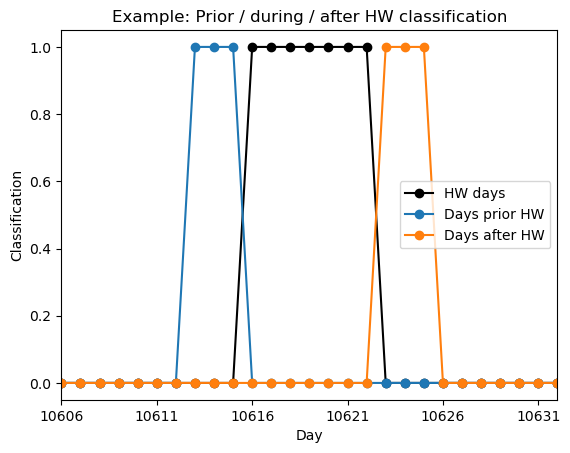

In [47]:
#visualize for a single basin

fig, ax = plt.subplots()

kk_basin = 0

ax.plot(is_heatwave[kk_basin,:], marker = 'o', color = 'k', label = 'HW days')
ax.plot(days_prior_heatwave[kk_basin,:], marker = 'o', label = 'Days prior HW')
ax.plot(days_after_heatwave[kk_basin,:], marker = 'o', label = 'Days after HW')

ax.legend()

left = 10612-N_days_before_after-3
right = 10626+N_days_before_after+3
ax.set_xlim(left = left, right = right)
ax.set_xticks(np.arange(left,right+1,5))

ax.set_ylabel('Classification')
ax.set_xlabel('Day')
ax.set_title('Example: Prior / during / after HW classification')

plt.show()

In [48]:
#ALL STATIONS: calculate average before/during/after heatwave precip for each season

#initialize
P_during_mean = np.zeros(N_basins)
P_prior_mean = np.zeros(N_basins)
P_after_mean = np.zeros(N_basins)

P_during_mean_DJF = np.zeros(N_basins) #winter
P_prior_mean_DJF = np.zeros(N_basins)
P_after_mean_DJF = np.zeros(N_basins)

P_during_mean_MAM = np.zeros(N_basins) #spring
P_prior_mean_MAM = np.zeros(N_basins)
P_after_mean_MAM = np.zeros(N_basins)

P_during_mean_JJA = np.zeros(N_basins) #summer
P_prior_mean_JJA = np.zeros(N_basins)
P_after_mean_JJA = np.zeros(N_basins)

P_during_mean_SON = np.zeros(N_basins) #autumn
P_prior_mean_SON = np.zeros(N_basins)
P_after_mean_SON = np.zeros(N_basins)

for kk_station in tqdm(range(N_basins)): #for each basin
    
    P_during_mean[kk_station] = np.nanmean(P_np[kk_station,is_heatwave[kk_station,:]==1])
    P_prior_mean[kk_station] = np.nanmean(P_np[kk_station,days_prior_heatwave[kk_station,:]==1])
    P_after_mean[kk_station] = np.nanmean(P_np[kk_station,days_after_heatwave[kk_station,:]==1])

    #winter
    P_during_mean_DJF[kk_station] = np.nanmean(P_np[kk_station,inds_DJF][is_heatwave[kk_station,inds_DJF]==1])
    P_prior_mean_DJF[kk_station] = np.nanmean(P_np[kk_station,inds_DJF][days_prior_heatwave[kk_station,inds_DJF]==1])
    P_after_mean_DJF[kk_station] = np.nanmean(P_np[kk_station,inds_DJF][days_after_heatwave[kk_station,inds_DJF]==1])

    #spring
    P_during_mean_MAM[kk_station] = np.nanmean(P_np[kk_station,inds_MAM][is_heatwave[kk_station,inds_MAM]==1])
    P_prior_mean_MAM[kk_station] = np.nanmean(P_np[kk_station,inds_MAM][days_prior_heatwave[kk_station,inds_MAM]==1])
    P_after_mean_MAM[kk_station] = np.nanmean(P_np[kk_station,inds_MAM][days_after_heatwave[kk_station,inds_MAM]==1])

    #summer
    P_during_mean_JJA[kk_station] = np.nanmean(P_np[kk_station,inds_JJA][is_heatwave[kk_station,inds_JJA]==1])
    P_prior_mean_JJA[kk_station] = np.nanmean(P_np[kk_station,inds_JJA][days_prior_heatwave[kk_station,inds_JJA]==1])
    P_after_mean_JJA[kk_station] = np.nanmean(P_np[kk_station,inds_JJA][days_after_heatwave[kk_station,inds_JJA]==1])

    #autumn
    P_during_mean_SON[kk_station] = np.nanmean(P_np[kk_station,inds_SON][is_heatwave[kk_station,inds_SON]==1])
    P_prior_mean_SON[kk_station] = np.nanmean(P_np[kk_station,inds_SON][days_prior_heatwave[kk_station,inds_SON]==1])
    P_after_mean_SON[kk_station] = np.nanmean(P_np[kk_station,inds_SON][days_after_heatwave[kk_station,inds_SON]==1])

#calculate differences: after heatwave minus before heatwave
P_after_prior_DJF = P_after_mean_DJF - P_prior_mean_DJF
P_after_prior_MAM = P_after_mean_MAM - P_prior_mean_MAM
P_after_prior_JJA = P_after_mean_JJA - P_prior_mean_JJA
P_after_prior_SON = P_after_mean_SON - P_prior_mean_SON

#calculate differences: after heatwave minus during heatwave
P_after_during_DJF = P_after_mean_DJF - P_during_mean_DJF
P_after_during_MAM = P_after_mean_MAM - P_during_mean_MAM
P_after_during_JJA = P_after_mean_JJA - P_during_mean_JJA
P_after_during_SON = P_after_mean_SON - P_during_mean_SON

#calculate differences: during heatwave minus before heatwave
P_during_prior_DJF = P_during_mean_DJF - P_prior_mean_DJF
P_during_prior_MAM = P_during_mean_MAM - P_prior_mean_MAM
P_during_prior_JJA = P_during_mean_JJA - P_prior_mean_JJA
P_during_prior_SON = P_during_mean_SON - P_prior_mean_SON

100%|████████████████████████████████████| 14425/14425 [00:46<00:00, 310.59it/s]


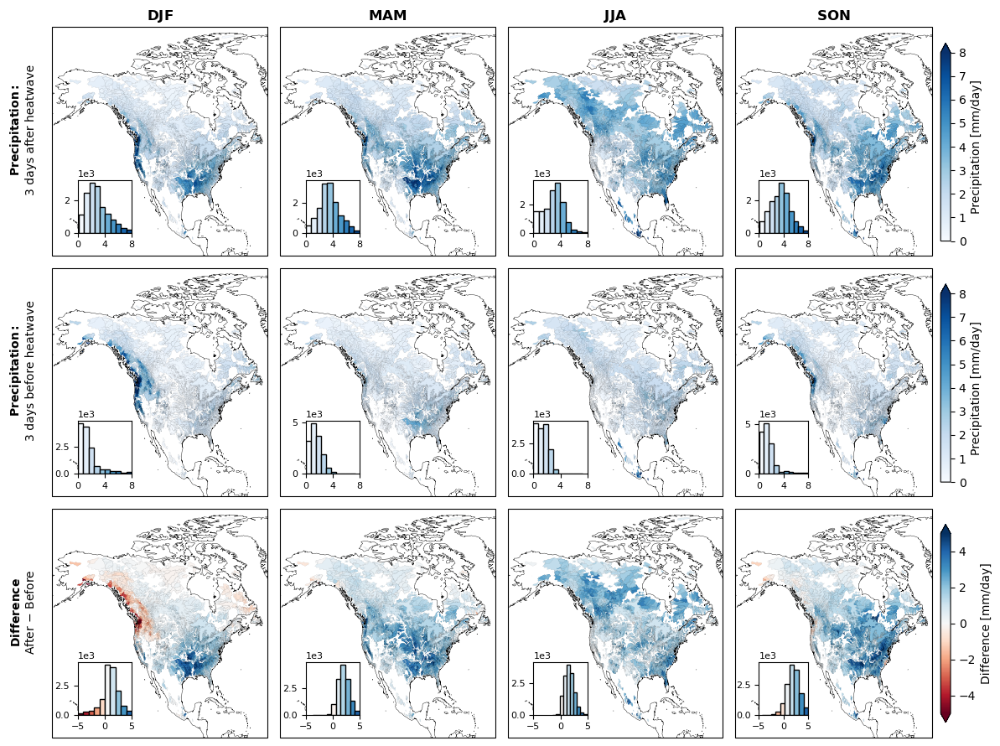

In [49]:
#MEAN PRECIP AFTER VS BEFORE HEATWAVE

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_after_mean_DJF, P_after_mean_MAM, P_after_mean_JJA, P_after_mean_SON],
    [P_prior_mean_DJF, P_prior_mean_MAM, P_prior_mean_JJA, P_prior_mean_SON],
    [P_after_prior_DJF, P_after_prior_MAM, P_after_prior_JJA, P_after_prior_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 8 if kk_var < 2 else 5
        vmin = 0 if kk_var < 2 else -vmax
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation [mm/day]' if kk_var < 2 else 'Difference [mm/day]'
            extend = 'max' if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + '\n3 days after heatwave'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + '\n3 days before heatwave'
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nAfter $-$ Before'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_after_before_diff.png', dpi = 300, bbox_inches = 'tight')

plt.show()

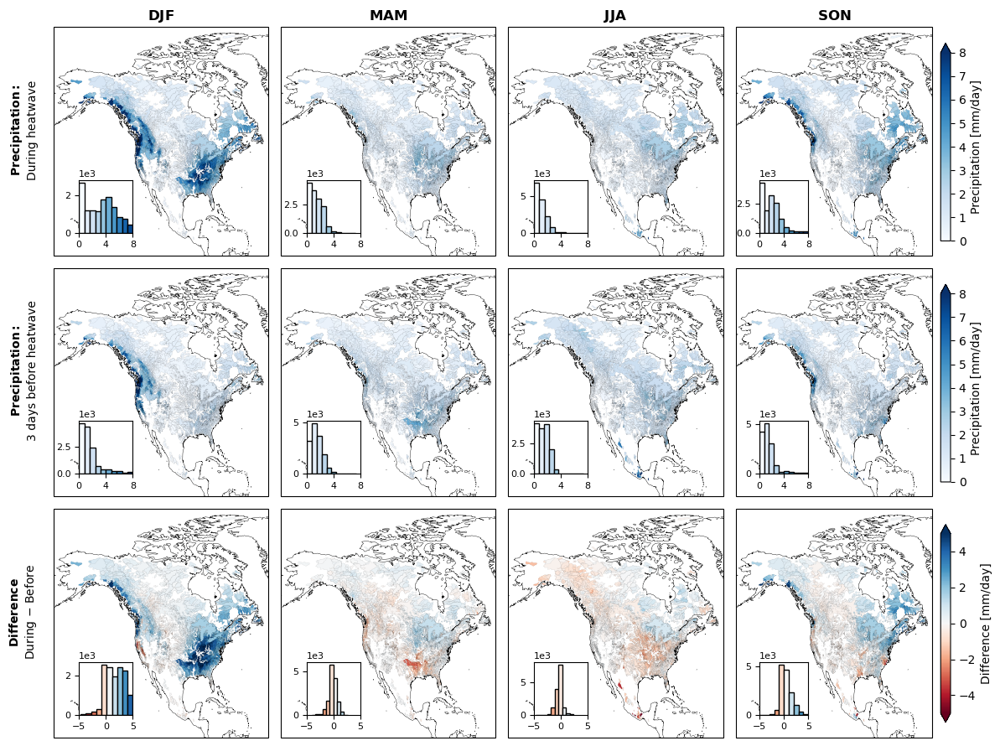

In [50]:
#MEAN PRECIP DURING VS BEFORE HEATWAVE

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_during_mean_DJF, P_during_mean_MAM, P_during_mean_JJA, P_during_mean_SON],
    [P_prior_mean_DJF, P_prior_mean_MAM, P_prior_mean_JJA, P_prior_mean_SON],
    [P_during_prior_DJF, P_during_prior_MAM, P_during_prior_JJA, P_during_prior_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 8 if kk_var < 2 else 5
        vmin = 0 if kk_var < 2 else -vmax
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation [mm/day]' if kk_var < 2 else 'Difference [mm/day]'
            extend = 'max' if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + '\nDuring heatwave'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + '\n3 days before heatwave'
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nDuring $-$ Before'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_during_before_diff.png', dpi = 350, bbox_inches = 'tight')

plt.show()

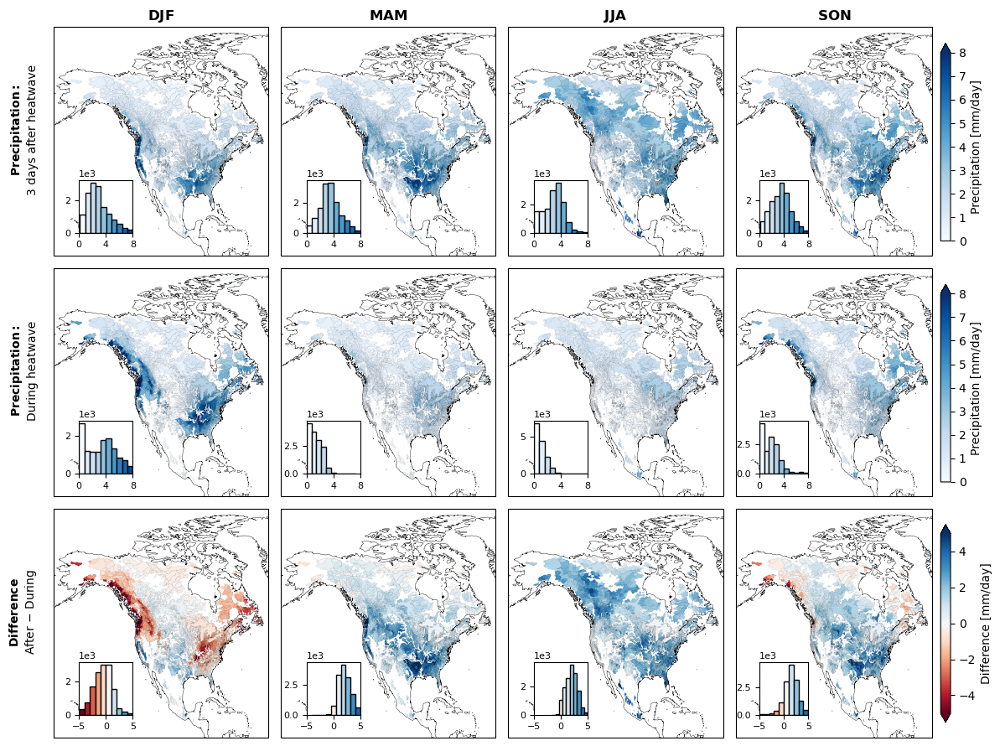

In [51]:
#MEAN PRECIP AFTER VS DURING HEATWAVE

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_after_mean_DJF, P_after_mean_MAM, P_after_mean_JJA, P_after_mean_SON],
    [P_during_mean_DJF, P_during_mean_MAM, P_during_mean_JJA, P_during_mean_SON],
    [P_after_during_DJF, P_after_during_MAM, P_after_during_JJA, P_after_during_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 8 if kk_var < 2 else 5
        vmin = 0 if kk_var < 2 else -vmax
        cmap = 'Blues' if kk_var < 2 else 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation [mm/day]' if kk_var < 2 else 'Difference [mm/day]'
            extend = 'max' if kk_var < 2 else 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + '\n3 days after heatwave'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + '\nDuring heatwave'
            elif kk_var == 2:
                ylabel = r'$\bf{Difference}$' + '\nAfter $-$ During'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_after_during_diff.png', dpi = 350, bbox_inches = 'tight')

plt.show()

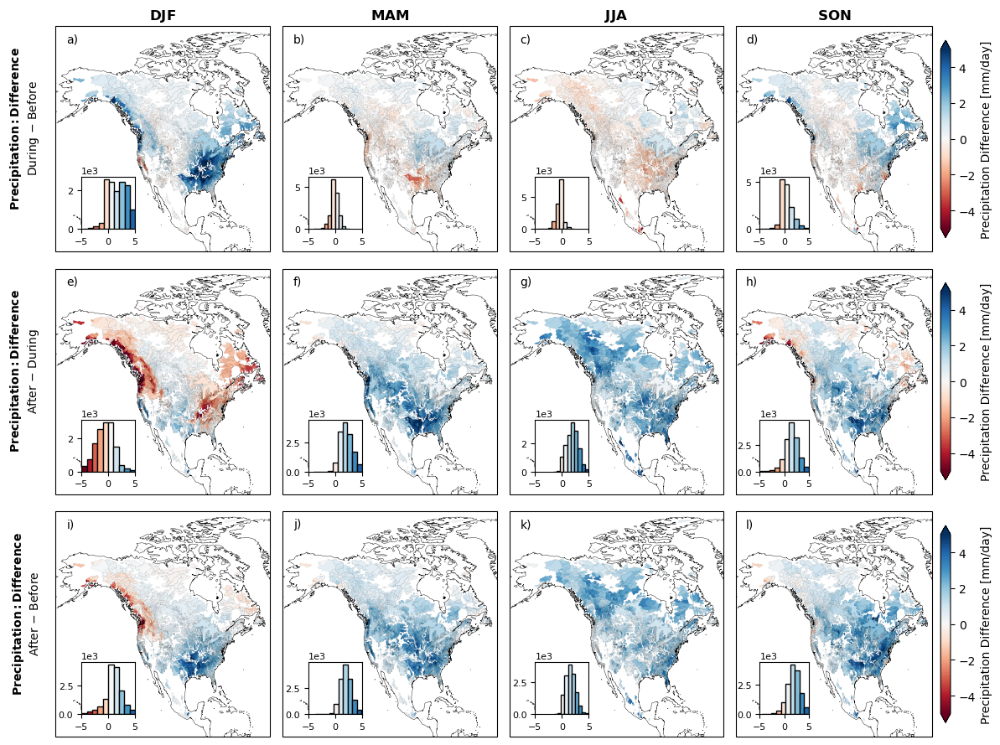

In [52]:
#MEAN PRECIP DIFFERENCES: AFTER VS DURING VS BEFORE HEATWAVE

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_during_prior_DJF, P_during_prior_MAM, P_during_prior_JJA, P_during_prior_SON],
    [P_after_during_DJF, P_after_during_MAM, P_after_during_JJA, P_after_during_SON],
    [P_after_prior_DJF, P_after_prior_MAM, P_after_prior_JJA, P_after_prior_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 5
        vmin = -vmax   
        cmap = 'RdBu'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation Difference [mm/day]'
            extend = 'both'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + r'$\bf{Difference}$' + '\nDuring $-$ Before'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + r'$\bf{Difference}$' + '\nAfter $-$ During'
            elif kk_var == 2:
                ylabel = r'$\bf{Precipitation:}$' + r'$\bf{Difference}$' + '\nAfter $-$ Before'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

        ax.text(x = 0.05, y = 0.93, s = abc[kk_var*4 + kk_season], transform = ax.transAxes, fontsize = 10)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_after_during_before_all_diff.png', dpi = 350, bbox_inches = 'tight')
    # plt.savefig('./Figures_hysets/P_after_during_before_all_diff_7days.png', dpi = 350, bbox_inches = 'tight')

plt.show()

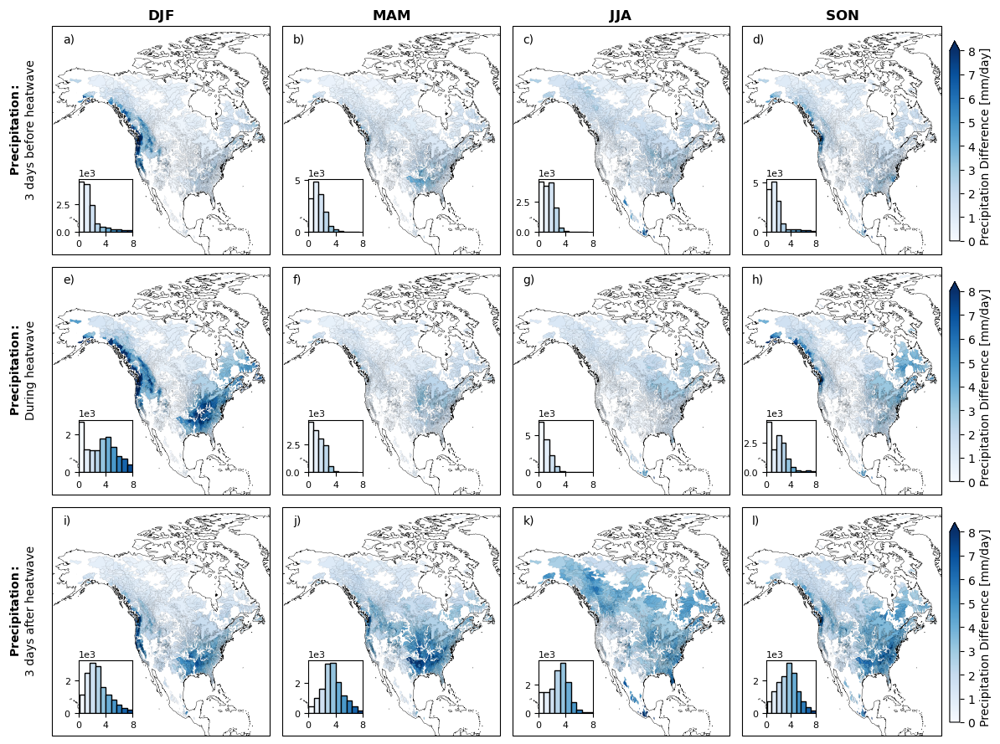

In [53]:
#MEAN PRECIP: AFTER, DURING, AND BEFORE HEATWAVE

saveIt = 0

nrows = 3
ncols = 4

fig, axes = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (3*ncols,3*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

variables = [
    [P_prior_mean_DJF, P_prior_mean_MAM, P_prior_mean_JJA, P_prior_mean_SON],
    [P_during_mean_DJF, P_during_mean_MAM, P_during_mean_JJA, P_during_mean_SON],
    [P_after_mean_DJF, P_after_mean_MAM, P_after_mean_JJA, P_after_mean_SON]
]

seasons = ['DJF', 'MAM', 'JJA', 'SON']

for kk_var in range(3): #for each variable (row)

    for kk_season in range(4): #for each season (column)

        ax = axes[kk_var,kk_season]
        
        var = variables[kk_var][kk_season]
        
        vmax = 8
        vmin = 0   
        cmap = 'Blues'
        
        coll = PolyCollection(verts, 
                              edgecolors='k', 
                              linewidth = 0.02, 
                              transform = ccrs.PlateCarree()
                             )
        coll.set_array(var[order])
        coll.set_clim((vmin, vmax))
        coll.set_cmap(cmap)
        c = ax.add_collection(copy(coll))
        
        ax.coastlines(resolution = '50m', linewidth = 0.3)
        ax.axes.set_aspect('auto')
        
        ax.set_xlim(left = -170, right = -50)
        ax.set_ylim(bottom = 10, top = 85)

        if kk_season == 3:
            ylabel = 'Precipitation Difference [mm/day]'
            extend = 'max'
            cb = fig.colorbar(c, ax=ax, fraction=0.046, pad=0.04, extend = extend)
            cb.ax.set_ylabel(ylabel)

        if kk_var == 0:
            ax.set_title(r'$\bf{' + seasons[kk_season] + '}$')
        if kk_season == 0:
            if kk_var == 0:
                ylabel = r'$\bf{Precipitation:}$' + '\n3 days before heatwave'
            elif kk_var == 1:
                ylabel = r'$\bf{Precipitation:}$' + '\nDuring heatwave'
            elif kk_var == 2:
                ylabel = r'$\bf{Precipitation:}$' + '\n3 days after heatwave'
            ax.text(-0.07, 0.55, ylabel, va='bottom', ha='center',
                    rotation='vertical', rotation_mode='anchor',
                    transform=ax.transAxes)

        ax.text(x = 0.05, y = 0.93, s = abc[kk_var*4 + kk_season], transform = ax.transAxes, fontsize = 10)
        
        ax_inset = inset_histogram(ax = ax, var = var[(var>vmin)&(var<vmax)], mapname = cmap, vmin = vmin, vmax = vmax)
        ax_inset.set_xticks(np.linspace(vmin, vmax, 3))
        ax_inset.tick_params(labelsize = 8)
        ax_inset.yaxis.offsetText.set_fontsize(8)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/P_after_during_before_all.png', dpi = 350, bbox_inches = 'tight')

plt.show()

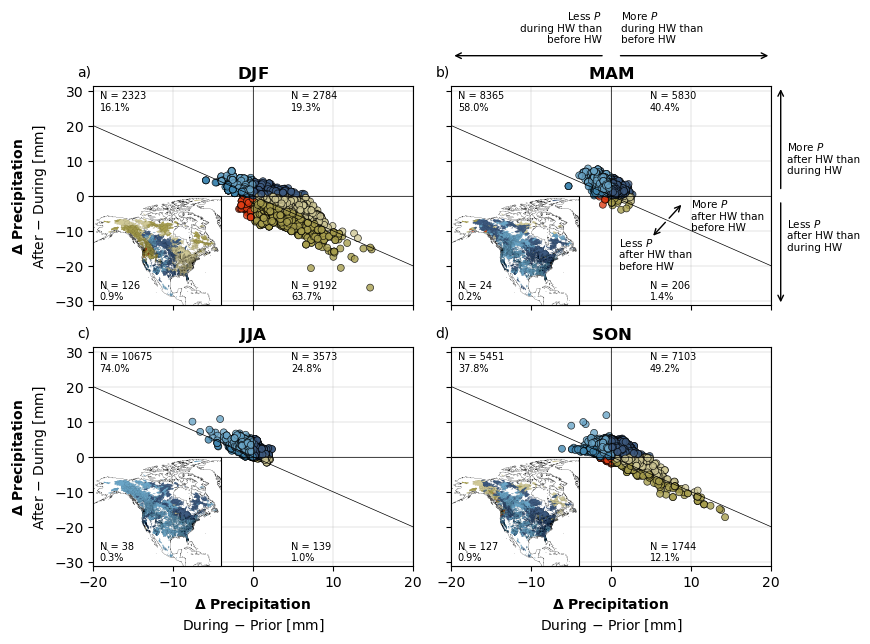

In [54]:
#FOR PAPER FIGURE

saveIt = 0

nrows = 2
ncols = 2

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 3.*nrows))

var1s = [P_during_prior_DJF, P_during_prior_MAM, P_during_prior_JJA, P_during_prior_SON]

var2s = [P_after_during_DJF, P_after_during_MAM, P_after_during_JJA, P_after_during_SON]

for kk, ax in enumerate(axes.flatten()):

    #colour data based off of quadrant in scatter plot
    c_categories = np.zeros(N_basins, dtype = 'int')
    c_categories[(var1s[kk]>0) & (var2s[kk]>0)] = 1
    c_categories[(var1s[kk]>0) & (var2s[kk]<0)] = 2
    c_categories[(var1s[kk]<0) & (var2s[kk]<0)] = 3
    cs = c_quadrants[c_categories,:]

    #now add darker shading based off of being above or below the (-1) - (+1) diagonal
    cs[(c_categories == 0) & (var1s[kk] < -var2s[kk])] = c_quadrants_2[0]
    cs[(c_categories == 1) & (var1s[kk] < -var2s[kk])] = c_quadrants_2[1]
    cs[(c_categories == 2) & (var1s[kk] < -var2s[kk])] = c_quadrants_2[2]
    cs[(c_categories == 3) & (var1s[kk] < -var2s[kk])] = c_quadrants_2[3]

    s = ax.scatter(var1s[kk][order], var2s[kk][order], c = cs[order], edgecolor = 'k', linewidth = 0.5, alpha = 0.8, s = 25)

    ax.set_title(r'$\bf{' + seasons[kk] + '}$')

    if kk > 1:
        ax.set_xlabel(r'$\bf{\Delta}$ ' + r'$\bf{Precipitation}$ ' + '\nDuring $-$ Prior [mm]')
    else:
        ax.set_xticklabels([])
    if np.mod(kk,2) == 0:
        ax.set_ylabel(r'$\bf{\Delta}$ ' + r'$\bf{Precipitation}$ ' + '\nAfter $-$ During [mm]')
    else:
        ax.set_yticklabels([])
    
    ax.axvline(x = 0, color = 'k', linewidth = 0.5)
    ax.axhline(y = 0, color = 'k', linewidth = 0.5)

    x0 = np.abs(ax.get_xlim()[0]) / (ax.get_xlim()[1] - ax.get_xlim()[0])
    xy = np.max(np.abs([var1s, var2s]))
    ax.set_xlim(left = -xy-5, right = xy+5)
    ax.set_xlim(left = -20, right = 20)
    ax.set_ylim(bottom = -xy-5, top = xy+5)

    ##### LABEL PERCENTAGE OF BASINS
    f1 = np.sum( (var1s[kk] < 0) & (var2s[kk] > 0) ) #/ N_basins
    f2 = np.sum( (var1s[kk] > 0) & (var2s[kk] > 0) ) #/ N_basins
    f3 = np.sum( (var1s[kk] > 0) & (var2s[kk] < 0) ) #/ N_basins
    f4 = np.sum( (var1s[kk] < 0) & (var2s[kk] < 0) ) #/ N_basins

    ax.grid(True, linewidth = 0.25)
    ax.set_axisbelow(True)

    xy = np.max(np.abs([ax.get_xlim(), ax.get_ylim()]))
    ax.plot([-xy,xy],[xy,-xy], linewidth = 0.5, color = 'k')

    ax.text(x = -0.05, y = 1.05, s = abc[kk], transform = ax.transAxes, fontsize = 10)
    
    ##### MAP INSET

    position = [0.0,0.0,0.4,0.5]
    ax_inset = plt.axes([0,0,1,1], aspect = 'auto', projection = ccrs.PlateCarree())
    ip = InsetPosition(ax, position)
    ax_inset.set_axes_locator(ip)

    coll = PolyCollection(verts, 
                          edgecolors='k', 
                          linewidth = 0.015, 
                          transform = ccrs.PlateCarree()
                         )

    coll.set_facecolor(cs[order])
    ax_inset.add_collection(copy(coll))
    
    ax_inset.coastlines(resolution = '50m', linewidth = 0.15)
    ax_inset.axes.set_aspect('auto')
    
    ax_inset.set_xlim(left = -170, right = -50)
    ax_inset.set_ylim(bottom = 10, top = 85)
    
    ax_inset.set_frame_on = False
    ax_inset.ticklabel_format(axis = 'y', style = 'sci', scilimits = (0,0))

    ax.text(x = 0.02, y = 0.89, s = 'N = {}\n{}%'.format(np.round(f1,decimals = 2),np.round(f1/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax.text(x = 0.62, y = 0.89, s = 'N = {}\n{}%'.format(np.round(f2,decimals = 2),np.round(f2/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax.text(x = 0.62, y = 0.025, s = 'N = {}\n{}%'.format(np.round(f3,decimals = 2),np.round(f3/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)
    ax_inset.text(x = 0.02, y = 0.025, s = 'N = {}\n{}%'.format(np.round(f4,decimals = 2),np.round(f4/N_basins*100,decimals = 1)), transform = ax.transAxes, fontsize = 7)

plt.tight_layout()

#annotate y-axis
axes[0,1].text(x = 1.05, y = 0.6, s = 'More $P$\nafter HW than\nduring HW', fontsize = 7.5, transform=axes[0,1].transAxes)
axes[0,1].text(x = 1.05, y = 0.25, s = 'Less $P$\nafter HW than\nduring HW', fontsize = 7.5, transform=axes[0,1].transAxes)

x1 = 1.03
axes[0,1].annotate(text = '', xy = (x1,0.52), xytext = (x1,1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')
axes[0,1].annotate(text = '', xy = (x1,0.48), xytext = (x1,0), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')

#annotate x-axis
y1 = 1.14
x0 = np.abs(axes[0,1].get_xlim()[0]) / (axes[0,1].get_xlim()[1] - axes[0,1].get_xlim()[0])

axes[0,1].text(x = x0+0.03, y = 1.2, s = 'More $P$\nduring HW than\nbefore HW', fontsize = 7.5, transform=axes[0,1].transAxes)
axes[0,1].text(x = x0-0.03, y = 1.2, s = 'Less $P$\nduring HW than\nbefore HW', fontsize = 7.5, transform=axes[0,1].transAxes, ha = 'right')

axes[0,1].annotate(text = '', xy = (x0+0.02,y1), xytext = (1,y1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')
axes[0,1].annotate(text = '', xy = (x0-0.02,y1), xytext = (0,y1), arrowprops=dict(arrowstyle="<-"), xycoords='axes fraction')

#annotate diagonal
axes[0,1].annotate(text = '', xy = (7,-7), xytext = (9,-2), arrowprops=dict(arrowstyle="<-"))
axes[0,1].annotate(text = '', xy = (7,-7), xytext = (5,-12), arrowprops=dict(arrowstyle="<-"))

axes[0,1].text(x = 10., y = -10., s = 'More $P$\nafter HW than\nbefore HW', fontsize = 7.5)
axes[0,1].text(x = 1, y = -21, s = 'Less $P$\nafter HW than\nbefore HW', fontsize = 7.5)


if saveIt:
    plt.savefig('./Figures_hysets/before_during_after_scatter_map.png', dpi = 500, bbox_inches = 'tight')

plt.show()

# HWs: function of $P_0$

In [55]:
#loop through precip thresholds (P0) and count heatwave days with P >= P0

P0s = np.arange(11) #precipitation thresholds
# P0s = np.arange(51) #precipitation thresholds
N_P0 = len(P0s) #number of precipitation thresholds

N_P0_hw_DJF = np.zeros((N_basins,N_P0)) #number of heatwave days with P >= P0 in winter
N_P0_hw_MAM = np.zeros((N_basins,N_P0)) #number of heatwave days with P >= P0 in spring
N_P0_hw_JJA = np.zeros((N_basins,N_P0)) #number of heatwave days with P >= P0 in summer
N_P0_hw_SON = np.zeros((N_basins,N_P0)) #number of heatwave days with P >= P0 in autumn

N_P0_nonhw_DJF = np.zeros((N_basins,N_P0)) #number of non-heatwave days with P >= P0 in winter
N_P0_nonhw_MAM = np.zeros((N_basins,N_P0)) #number of non-heatwave days with P >= P0 in spring
N_P0_nonhw_JJA = np.zeros((N_basins,N_P0)) #number of non-heatwave days with P >= P0 in summer
N_P0_nonhw_SON = np.zeros((N_basins,N_P0)) #number of non-heatwave days with P >= P0 in autumn

for kk_basin in tqdm(range(N_basins)): #for each basin (& print progress bar)
    
    for kk_P0, P0 in enumerate(P0s):
    
        N_P0_hw_DJF[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 12) | (month == 1)  | (month == 2 )) & (is_heatwave[kk_basin] == 1))
        N_P0_hw_MAM[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 3)  | (month == 4)  | (month == 5 )) & (is_heatwave[kk_basin] == 1))
        N_P0_hw_JJA[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 6)  | (month == 7)  | (month == 8 )) & (is_heatwave[kk_basin] == 1))
        N_P0_hw_SON[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 9)  | (month == 10) | (month == 11)) & (is_heatwave[kk_basin] == 1))

        N_P0_nonhw_DJF[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 12) | (month == 1)  | (month == 2 )) & (is_heatwave[kk_basin] == 0))
        N_P0_nonhw_MAM[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 3)  | (month == 4)  | (month == 5 )) & (is_heatwave[kk_basin] == 0))
        N_P0_nonhw_JJA[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 6)  | (month == 7)  | (month == 8 )) & (is_heatwave[kk_basin] == 0))
        N_P0_nonhw_SON[kk_basin,kk_P0] = np.sum((P_np[kk_basin] >= P0)  & ((month == 9)  | (month == 10) | (month == 11)) & (is_heatwave[kk_basin] == 0))

#fraction of heatwave days with P > P0
f_P0_hw_DJF = N_P0_hw_DJF / np.expand_dims(total_hw_days_DJF, axis = -1)
f_P0_hw_MAM = N_P0_hw_MAM / np.expand_dims(total_hw_days_MAM, axis = -1)
f_P0_hw_JJA = N_P0_hw_JJA / np.expand_dims(total_hw_days_JJA, axis = -1)
f_P0_hw_SON = N_P0_hw_SON / np.expand_dims(total_hw_days_SON, axis = -1)

#fraction of nonheatwave days with P > P0
f_P0_nonhw_DJF = N_P0_nonhw_DJF / np.expand_dims(total_nonhw_days_DJF, axis = -1)
f_P0_nonhw_MAM = N_P0_nonhw_MAM / np.expand_dims(total_nonhw_days_MAM, axis = -1)
f_P0_nonhw_JJA = N_P0_nonhw_JJA / np.expand_dims(total_nonhw_days_JJA, axis = -1)
f_P0_nonhw_SON = N_P0_nonhw_SON / np.expand_dims(total_nonhw_days_SON, axis = -1)

100%|█████████████████████████████████████| 14425/14425 [02:27<00:00, 97.77it/s]


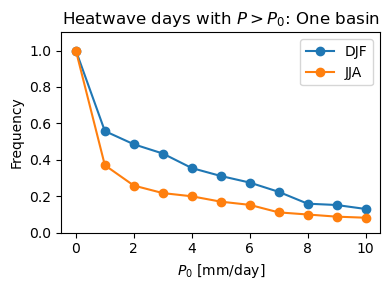

In [56]:
#cluster input for one basin

saveIt = 0

kk_basin = 0

nrows = 1
ncols = 1

fig, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 3*nrows))

ax.plot(P0s,f_P0_hw_DJF[kk_basin], marker = 'o', label = 'DJF')
ax.plot(P0s,f_P0_hw_JJA[kk_basin], marker = 'o', label = 'JJA')
ax.set_title('Heatwave days with $P>P_0$: One basin')
ax.legend()

ax.set_ylim(bottom = 0, top = 1.1)
ax.set_ylabel('Frequency')
ax.set_xlabel('$P_0$ [mm/day]')

plt.tight_layout()

if saveIt:
    plt.savefig('Figures_hysets/cluster_input_one_basin.png', dpi = 300, bbox_inches = 'tight')

plt.show()

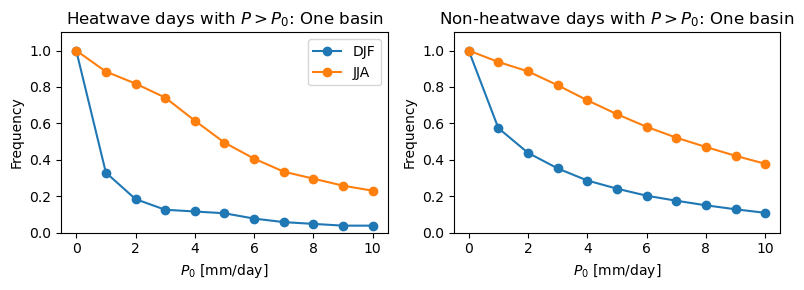

In [57]:
#NOTE: There is a high degree of variability across basins -- some have wetter summers than winters.

# kk_basin = 0
kk_basin = 14420

nrows = 1
ncols = 2

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 3*nrows))

ax = axes[0]
ax.plot(P0s,f_P0_hw_DJF[kk_basin], marker = 'o', label = 'DJF')
ax.plot(P0s,f_P0_hw_JJA[kk_basin], marker = 'o', label = 'JJA')
ax.set_title('Heatwave days with $P>P_0$: One basin')
ax.legend()

ax = axes[1]
ax.plot(P0s,f_P0_nonhw_DJF[kk_basin], marker = 'o')
ax.plot(P0s,f_P0_nonhw_JJA[kk_basin], marker = 'o')
ax.set_title('Non-heatwave days with $P>P_0$: One basin')

for ax in axes:
    ax.set_ylim(bottom = 0, top = 1.1)
    ax.set_ylabel('Frequency')
    ax.set_xlabel('$P_0$ [mm/day]')

plt.tight_layout()

plt.show()

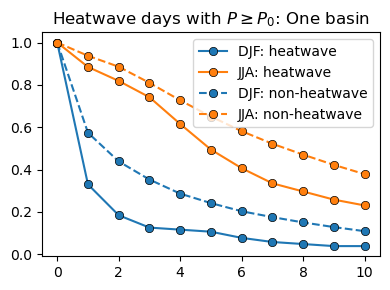

In [58]:
# AND there are differences between heatwave precip and non-heatwave precip by season

# kk_basin = 0
kk_basin = 14420

nrows = 1
ncols = 1

fig, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 3*nrows))

#heatwaves
ax.plot(P0s,f_P0_hw_DJF[kk_basin], marker = 'o', label = 'DJF: heatwave', markeredgewidth = 0.5, markeredgecolor = 'k',color = 'C0')
ax.plot(P0s,f_P0_hw_JJA[kk_basin], marker = 'o', label = 'JJA: heatwave', markeredgewidth = 0.5, markeredgecolor = 'k',color = 'C1')

#nonheatwaves
ax.plot(P0s,f_P0_nonhw_DJF[kk_basin], marker = 'o', linestyle = '--', markeredgewidth = 0.5, markeredgecolor = 'k', markerfacecolor = None, label = 'DJF: non-heatwave', color = 'C0')
ax.plot(P0s,f_P0_nonhw_JJA[kk_basin], marker = 'o', linestyle = '--', markeredgewidth = 0.5, markeredgecolor = 'k', markerfacecolor = None, label = 'JJA: non-heatwave', color = 'C1')

ax.set_title('Heatwave days with $P \geq P_0$: One basin')
ax.legend()

for ax in axes:
    ax.set_ylim(bottom = 0, top = 1.1)
    ax.set_ylabel('Frequency')
    ax.set_xlabel('$P_0$ [mm/day]')

plt.tight_layout()

plt.show()

In [77]:
#for simplicity, cluster basins based off of heatwave-precip frequency for DJF / JJA
#future work can consider differences relative to non-heatwave conditions?

cluster_input = np.concatenate([f_P0_hw_DJF,f_P0_hw_JJA], axis = 1)
n_seq = 2 #number of variables in sequence in the clustering input 
labels_season = ['DJF','JJA']

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(cluster_input)

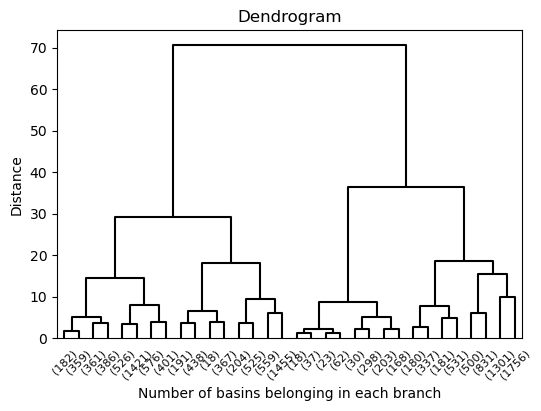

In [78]:
#visualize dendrogram

saveIt = 0

fig, ax = plt.subplots(figsize = (6,4))

d = plot_dendrogram(model, truncate_mode='level', p=4, color_threshold = 0, above_threshold_color = 'k')

ax.set_xlabel('Number of basins belonging in each branch')
ax.set_ylabel('Distance')
ax.set_title('Dendrogram')

if saveIt:
    plt.savefig('Figures_hysets/dendrogram.png', dpi = 300, bbox_inches = 'tight')

In [85]:
#from dendrogram, choose number of clusters and calculate mean pattern of each cluster

n_clusters = 4
clustering = AgglomerativeClustering(n_clusters = n_clusters).fit(cluster_input)

#calculate average of each cluster
cluster_patterns = np.empty((n_clusters, np.shape(cluster_input)[1]))
for cluster in range(n_clusters):
    cluster_inds = np.argwhere(clustering.labels_ == cluster)
    cluster_patterns[cluster,:] = np.mean(cluster_input[cluster_inds.reshape(-1,1),:], axis = 0)

#reorder the labels: want to organize from driest to wettest for visualizations
# 10 mm limit
labels_new = np.zeros(N_basins)
labels_new[clustering.labels_ == 0] = 2
labels_new[clustering.labels_ == 1] = 1
labels_new[clustering.labels_ == 2] = 3
labels_new[clustering.labels_ == 3] = 0
clustering.labels_ = labels_new

# # 20mm limit
# labels_new = np.zeros(N_basins)
# labels_new[clustering.labels_ == 0] = 0
# labels_new[clustering.labels_ == 1] = 1
# labels_new[clustering.labels_ == 2] = 3
# labels_new[clustering.labels_ == 3] = 2
# clustering.labels_ = labels_new

# # 50mm limit
# labels_new = np.zeros(N_basins)
# labels_new[clustering.labels_ == 0] = 1
# labels_new[clustering.labels_ == 1] = 2
# labels_new[clustering.labels_ == 2] = 0
# labels_new[clustering.labels_ == 3] = 3
# clustering.labels_ = labels_new

#assign cluster names for visualizations
cluster_names = [
    'Dry winter, dry summer',
    'Moderate',
    'Moderate, wetter winter',
    'Wet winter, dry summer'
]

cluster_names_2line = [
    'Dry winter,\ndry summer',
    'Moderate',
    'Moderate,\nwetter winter',
    'Wet winter,\ndry summer'
]

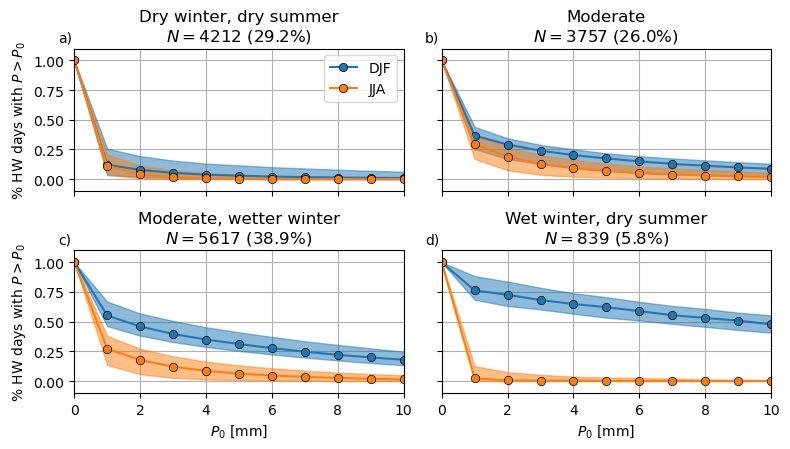

In [86]:
#visualize cluster patterns

saveIt = 0

N_cluster_members = np.zeros(4)

#shading: 1-sigma with median
p1 = 50
p2 = 16
p3 = 84

nrows = 2
ncols = 2

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = (4*ncols, 2.3*nrows))

for kk_cluster, ax in enumerate(axes.flatten()):

    cluster_inds = np.argwhere(clustering.labels_ == kk_cluster).squeeze()
    N_cluster_members[kk_cluster] = len(cluster_inds)
    y1 = np.percentile(cluster_input[cluster_inds,:], q = p1, axis = 0)
    y2 = np.percentile(cluster_input[cluster_inds,:], q = p2, axis = 0)
    y3 = np.percentile(cluster_input[cluster_inds,:], q = p3, axis = 0)

    inds = []
    for kk_season in range(n_seq):
        inds.append(np.arange(kk_season*N_P0,(kk_season + 1)*N_P0))
    
    #heatwaves
    ax.fill_between(x = P0s, y1 = y2[inds[0]], y2 = y3[inds[0]], alpha = 0.5, color = 'C0', edgecolor = 'C0')
    ax.plot(P0s,y1[inds[0]], marker = 'o', label = 'DJF', markeredgewidth = 0.5, markeredgecolor = 'k',color = 'C0')

    ax.fill_between(x = P0s, y1 = y2[inds[1]], y2 = y3[inds[1]], alpha = 0.5, color = 'C1', edgecolor = 'C1')
    ax.plot(P0s,y1[inds[1]], marker = 'o', label = 'JJA', markeredgewidth = 0.5, markeredgecolor = 'k',color = 'C1')

    ax.set_ylim(bottom = -0.1, top = 1.1)
    ax.set_xlim(left = 0, right = 10)
    # ax.set_xlim(left = 0, right = 50)
    # ax.set_title('Cluster {}'.format(kk_cluster))
    ax.set_title(cluster_names[kk_cluster] + '\n$N={}$ (${}$%)'.format(int(N_cluster_members[kk_cluster]), np.round(N_cluster_members[kk_cluster]/N_basins*100, decimals = 1)))

    ax.grid(True)
    ax.set_axisbelow(True)

    if kk_cluster < 2:
        ax.set_xticklabels([])
    else:
        ax.set_xlabel('$P_0$ [mm]')
    if np.mod(kk_cluster,2) == 0:
        ax.set_ylabel('% HW days with $P>P_0$')
    else:
        ax.set_yticklabels([])

    ax.text(x = -0.05, y = 1.05, s = abc[kk_cluster], transform = ax.transAxes, fontsize = 10)

axes[0,0].legend()


plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/cluster_patterns_P0.png', dpi = 350, bbox_inches = 'tight')
    # plt.savefig('./Figures_hysets/cluster_patterns_P0_50mm.png', dpi = 350, bbox_inches = 'tight')

plt.show()

In [87]:
kk_cluster = 3
cluster_inds = np.argwhere(clustering.labels_ == kk_cluster).squeeze()
N_cluster_members[kk_cluster] = len(cluster_inds)
y1 = np.percentile(cluster_input[cluster_inds,:], q = p1, axis = 0)

print(y1[:11])
print(y1[11:])

[1.         0.76315789 0.72636816 0.68181818 0.64893617 0.62176166
 0.58937198 0.55434783 0.53157895 0.50828729 0.47826087]
[1.         0.02304147 0.00520833 0.00460829 0.0044843  0.
 0.         0.         0.         0.         0.        ]


In [88]:
#make a colourmap for the clusters

c_clusters = np.array([
    [238, 102, 68],
    [163, 243, 245],
    [136, 183, 211],
    [33, 48, 69]
])/256

cmap_name = '4_clusters'
n_bin = 4
cmap = LinearSegmentedColormap.from_list(cmap_name, c_clusters, N = n_bin)

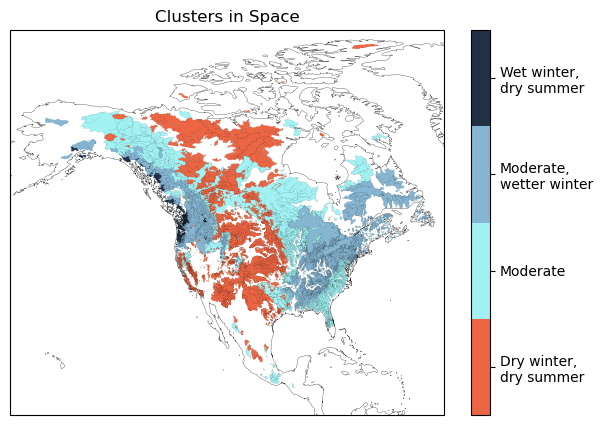

In [89]:
#clusters in space

saveIt = 0

ncols = 1
nrows = 1

fig, ax = plt.subplots(
    nrows = nrows, ncols = ncols, figsize = (7*ncols,5*nrows), subplot_kw=dict(projection = ccrs.PlateCarree())
)

var = clustering.labels_
vmin = np.nanmin(var)
vmax = np.nanmax(var)

coll = PolyCollection(verts, 
                      edgecolors='k', 
                      linewidth = 0.03, 
                      transform = ccrs.PlateCarree()
                     )
coll.set_array(var[order])
coll.set_clim((vmin-0.5, vmax+0.5))
coll.set_cmap(cmap)
c = ax.add_collection(copy(coll))


ax.coastlines(resolution = '50m', linewidth = 0.2)
ax.axes.set_aspect('auto')

ax.set_xlim(left = -170, right = -50)
ax.set_ylim(bottom = 10, top = 85)

ax.set_title('Clusters in Space')

cbar = plt.colorbar(c, ax = ax)
cbar.ax.set_yticks(np.arange(n_clusters))
cbar.ax.set_yticklabels(cluster_names_2line)

if saveIt:
    plt.savefig('./Figures_hysets/cluster_patterns_space_P0_50mm.png', dpi = 350, bbox_inches = 'tight')

plt.show()

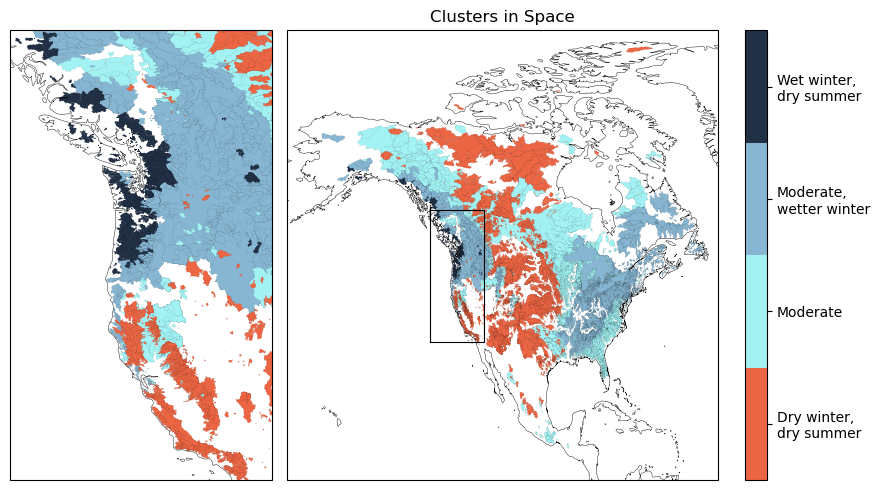

In [90]:
#clusters in space

saveIt = 0

ncols = 3
nrows = 1

fig = plt.figure(figsize = (9, 5))
gs = fig.add_gridspec(nrows = nrows, ncols = ncols)

ax_westcoast = fig.add_subplot(gs[0, 0], projection = ccrs.PlateCarree())
ax_NA = fig.add_subplot(gs[0, 1:], projection = ccrs.PlateCarree())

var = clustering.labels_
vmin = np.nanmin(var)
vmax = np.nanmax(var)

for ax in [ax_westcoast,ax_NA]:

    coll = PolyCollection(verts, 
                          edgecolors='k', 
                          linewidth = 0.03, 
                          transform = ccrs.PlateCarree()
                         )
    coll.set_array(var[order])
    coll.set_clim((vmin-0.5, vmax+0.5))
    coll.set_cmap(cmap)

    c = ax.add_collection(copy(coll))

    ax.coastlines(resolution = '50m', linewidth = 0.3)
    ax.axes.set_aspect('auto')

bottom = 33
top = 55
left = -130
right = -115

ax_westcoast.set_xlim(left = left, right = right)
ax_westcoast.set_ylim(bottom = bottom, top = top)

ax_NA.set_xlim(left = -170, right = -50)
ax_NA.set_ylim(bottom = 10, top = 85)
ax_NA.plot([left, right, right, left, left], [bottom, bottom, top, top, bottom], color = 'k', linewidth = 0.8)
ax_NA.set_title('Clusters in Space')

cbar = plt.colorbar(c, ax = ax_NA)
cbar.ax.set_yticks(np.arange(n_clusters))
cbar.ax.set_yticklabels(cluster_names_2line)

plt.tight_layout()

if saveIt:
    plt.savefig('./Figures_hysets/cluster_patterns_space_P0_westcoast.png', dpi = 350, bbox_inches = 'tight')
    # plt.savefig('./Figures_hysets/cluster_patterns_space_P0_westcoast_50mm.png', dpi = 350, bbox_inches = 'tight')

plt.show()

# SUMMARY

In [69]:
N_variables = 7
variables = [[] for kk in range(N_variables)]

#HEATWAVE VS NONHEATWAVE: FRACTION DAYS WET
variables[0] = [wet_frac_diff_DJF, wet_frac_diff_MAM, wet_frac_diff_JJA, wet_frac_diff_SON]

#HEATWAVE VS NONHEATWAVE: MEAN PRECIP ON WET DAYS
variables[1] = [P_mean_wet_diff_DJF, P_mean_wet_diff_MAM, P_mean_wet_diff_JJA, P_mean_wet_diff_SON]

#HEATWAVE FINAL DAY VS HEATWAVE OTHER DAYS, WET HEATWAVES: FRACTION DAYS WET
variables[2] = [frac_wet_diff_DJF, frac_wet_diff_MAM, frac_wet_diff_JJA, frac_wet_diff_SON]

#HEATWAVE FINAL DAY VS HEATWAVE OTHER DAYS, WET HEATWAVES: MEAN PRECIP
variables[3] = [P_final_nonfinal_diff_DJF, P_final_nonfinal_diff_MAM, P_final_nonfinal_diff_JJA, P_final_nonfinal_diff_SON]

#MEAN PRECIP DURING HEATWAVE VS BEFORE HEATWAVE
variables[4] = [P_during_prior_DJF, P_during_prior_MAM, P_during_prior_JJA, P_during_prior_SON]

#MEAN PRECIP AFTER HEATWAVE VS DURING HEATWAVE
variables[5] = [P_after_during_DJF, P_after_during_MAM, P_after_during_JJA, P_after_during_SON]

#MEAN PRECIP AFTER HEATWAVE VS BEFORE HEATWAVE
variables[6] = [P_after_prior_DJF, P_after_prior_MAM, P_after_prior_JJA, P_after_prior_SON]


In [229]:
kk_var = 0
kk_season = 0
[np.round(len(np.argwhere(variables[kk_var][kk_season]>0))) for kk_season in range(4)]

[9863, 677, 522, 4625]

In [91]:
for kk_var in range(N_variables):
    print([np.round(len(np.argwhere(variables[kk_var][kk_season]>0))/N_basins*100, decimals = 1) for kk_season in range(4)])
        

[68.4, 4.7, 3.6, 32.1]
[62.1, 10.6, 1.4, 19.4]
[85.1, 92.2, 84.7, 90.5]
[81.8, 93.1, 84.7, 88.2]
[83.0, 41.8, 25.7, 61.3]
[35.4, 98.4, 98.8, 87.0]
[80.8, 98.9, 97.9, 93.9]


In [323]:
cluster_names[0]

'Dry winter, dry summer'

In [95]:
kk_cluster = 3
print(cluster_names[kk_cluster])
for kk_var in range(N_variables):
    cluster_inds = np.argwhere(clustering.labels_ == kk_cluster).squeeze()
    N_basins_cluster = len(cluster_inds)
    print([np.round(len(np.argwhere(variables[kk_var][kk_season][cluster_inds]>0))/N_basins_cluster*100, decimals = 1) for kk_season in range(4)])
    

Wet winter, dry summer
[98.5, 1.1, 0.0, 19.7]
[100.0, 2.3, 0.0, 48.3]
[44.3, 98.0, 50.3, 92.0]
[10.3, 95.8, 50.2, 71.4]
[99.2, 10.0, 0.2, 78.7]
[0.0, 93.9, 100.0, 21.3]
[4.5, 93.9, 94.0, 49.0]


In [254]:
for kk_var in range(N_variables):
    print([np.round(np.nanmean(variables[kk_var][kk_season]), decimals = 1) for kk_season in range(4)])
       

[0.1, -0.2, -0.2, -0.1]
[2.5, -3.3, -3.5, -1.1]
[0.2, 0.3, 0.3, 0.3]
[3.0, 2.2, 1.4, 3.0]
[2.0, -0.1, -0.4, 0.6]
[-1.1, 2.2, 1.9, 1.4]
[1.0, 2.0, 1.6, 2.0]


In [252]:
for kk_var in range(N_variables):
    print([np.round(np.nanstd(variables[kk_var][kk_season]), decimals = 1) for kk_season in range(4)])

[0.2, 0.1, 0.1, 0.1]
[6.6, 2.7, 1.9, 4.4]
[0.2, 0.1, 0.1, 0.2]
[3.3, 1.7, 1.0, 2.3]
[2.1, 0.7, 0.6, 1.3]
[2.5, 1.3, 1.1, 1.7]
[1.7, 1.0, 0.9, 1.3]


In [242]:
print(np.round(len(np.argwhere(frac_wet_final_wet_SON>=0.5))/N_basins*100, decimals = 1)) 
        

75.1


In [248]:
vars = [frac_wet_nonfinal_wet_DJF, frac_wet_nonfinal_wet_MAM, frac_wet_nonfinal_wet_JJA, frac_wet_nonfinal_wet_SON]
print([np.round(len(np.argwhere(var<0.5))/N_basins*100, decimals = 1) for var in vars])


[70.7, 98.8, 98.8, 91.7]


In [ ]:
vars = [frac_wet_nonfinal_wet_DJF, frac_wet_nonfinal_wet_MAM, frac_wet_nonfinal_wet_JJA, frac_wet_nonfinal_wet_SON]
print([np.round(len(np.argwhere(var<0.5))/N_basins*100, decimals = 1) for var in vars])